# Introduction

**Background Information**.  
What is geothermal energy? Geothermal is the natural heat of the Earth derived from the decay of the radioactive elements in the Earth’s crust and transferred to the subsurface by conduction and convection. 
Temperatures at the core–mantle boundary may reach over 4000 °C (7200 °F). The high temperature and pressure in Earth's interior cause some rock to melt and solid mantle to behave plastically, resulting in parts of the mantle convecting upward since it is lighter than the surrounding rock. Rock and water is heated in the crust, sometimes up to 370 °C (700 °F).
What is geothermal used for? For centuries, geothermal springs have been used for bathing, heating and cooking. But in the early 20th century people started to consider geothermal as a practical source of energy with huge potential. Geothermal energy is now used to produce electricity, to heat and cool buildings as well as for other industrial purposes like fruit and vegetable cultivation. 
Reference: https://en.wikipedia.org/wiki/Geothermal_energy, https://www.geothermal-energy.org/explore/what-is-geothermal/
[](https://en.wikipedia.org/wiki/Geothermal_energy).  
[](https://www.geothermal-energy.org/explore/what-is-geothermal/)


**Problem Statement**.  
2 parameters are important in the evaluation of geothermal potential. 
Formation Temperature: The higher the temperature at bottom, the higher the potential for Geothermal use. Despite the abundance of techniques for collecting drilling and well operation data, they do not necessarily provide the real Bottom Hole Temperature (BHT). 
Flowrate Capacity: Flowrate determines the amount of fluid that can flow naturally or be pumped through the formation or pipe. Higher permeability formations or larger diameter pipe are more viable for Geothermal purposes.

There is the belief that old (or current) oil and gas wells can be re-purposed for geothermal energy use, using the subsurface infrastructure already in place plus the data already collected during the life of the well.

We are provided with relevant well data from 2 Oil & Gas basins: 
  * `Duvernay` in Alberta, Canada
  * `Eaglebine` in Texas, USA 

The information includes;
  * Well logs in LAS format
  * Well header, drilling, completion and production data
  * BHT and DST Temperature measurements
  * Calculated synthetic true temperature

Project/ML Goals.  
The goal of this **project** is to evaluate what wells are showing geothermal potential and based on those, which areas deserve further evaluation.  
The goal of this **notebook** is to develop a machine learning model to predict the real bottom hole temperature and determine a subset of available wells showing the most potential for geothermal energy use.  

This notebook has XX sections;  
  
  1. Import Libraries & Data
  2. Organize Data
  3. Exploratory Data Analysis 
  4. Feature Engineering and Model
  5. Geothermal Well Selection

---

# 1. Import Libraries & Data

In [109]:
# Import libraries
import pandas as pd
import numpy as np
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")
import matplotlib.pyplot as plt
%matplotlib inline
from tqdm.notebook import tqdm  # progress bar
import itertools
import os
from zipfile import ZipFile
import lasio
#!pip install welly
import welly
from welly import well, project
import os
import math

#### 1.1. Data was downloaded from Google drive link from datathon organizers and unzipped to a local project folder

In [2]:
'''
# Extract all zipped files
with ZipFile('data\well_log_files.zip', 'r') as zipLAS:
    zipLAS.extractall('data')
with ZipFile('data\Duvernay-20210528T150855Z-001.zip', 'r') as zipDuv:
    zipDuv.extractall('data')
with ZipFile('data\Eaglebine-20210528T150901Z-001.zip', 'r') as zipEag:
    zipEag.extractall('data')
with ZipFile('data\Duvernay\Duvernay\Mud log image files SPE April 20 2021.zip', 'r') as zipDuvMud:
    zipDuvMud.extractall('data\Duvernay Mud Logs')
with ZipFile('data\Eaglebine\Eaglebine\Mud log images SPE April 20 2021.zip', 'r') as zipEagMud:
    zipEagMud.extractall('data\Eaglebine Mud Logs')
'''

"\n# Extract all zipped files\nwith ZipFile('data\\well_log_files.zip', 'r') as zipLAS:\n    zipLAS.extractall('data')\nwith ZipFile('data\\Duvernay-20210528T150855Z-001.zip', 'r') as zipDuv:\n    zipDuv.extractall('data')\nwith ZipFile('data\\Eaglebine-20210528T150901Z-001.zip', 'r') as zipEag:\n    zipEag.extractall('data')\nwith ZipFile('data\\Duvernay\\Duvernay\\Mud log image files SPE April 20 2021.zip', 'r') as zipDuvMud:\n    zipDuvMud.extractall('data\\Duvernay Mud Logs')\nwith ZipFile('data\\Eaglebine\\Eaglebine\\Mud log images SPE April 20 2021.zip', 'r') as zipEagMud:\n    zipEagMud.extractall('data\\Eaglebine Mud Logs')\n"

### 1.2. Create directory paths and data wrangling functions

In [3]:
# set paths of different subdirectories
dir_eaglebine = 'Data/Eaglebine/Eaglebine/'
dir_duvernay = 'Data/Duvernay/Duvernay/'

# Clean column headers
def clean_column_headers(df):
    '''
    Checks and cleans up column names
    '''
    if ('Unnamed: 0' in df.columns):
        df=df.drop('Unnamed: 0',axis='columns')
    df.columns = (df.columns
                  .str.replace(".","_")
                  .str.replace("`","_")
                  .str.replace(" ","_")
                  .str.replace(":","")
                  .str.lower()
                 )
    return df

# Find Missing Data
def missing_data(df):
    '''
    Checks df for nulls, displays size & location
    '''
    if df.isnull().sum().sum() > 0: #if any missing value is found after summing total values in all columns
        mask_total = df.isnull().sum().sort_values(ascending=False) 
        total = mask_total[mask_total > 0]

        mask_percent = round((df.isnull().mean().sort_values(ascending=False))*100, 1)  
        percent = mask_percent[mask_percent > 0] 

        missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
    
        print(f'Total and Percentage of NaN:\n {missing_data}')
        # Display missing data in heat map
        plt.figure(figsize=(16, 10))
        sns.heatmap(df.isnull(), cbar=False)
    else: 
        print('No NaN found.')


---

# 2. Organize Data
#### Majority of data wrangling code in this section was provided by datathon organizers.  
We used the code to pull all data into the notebook

## 2.1. Organize Eaglebine temperature data

In [104]:
# Import BHT
Eaglebine_BHT = pd.read_excel(dir_eaglebine+'Eaglebine BHT TSC data for SPE April 21 2020.xlsx')
Eaglebine_BHT['TempC_BHT'] = (Eaglebine_BHT['BHTorMRT (maximum recorded temperature) oF'] - 32) * (5./9.)

# Read in Eaglebine synthetic "true formation temperature"
Eaglebine_Truth = pd.read_excel(dir_eaglebine+'Eaglebine TrueTemp_Train2.xlsx')
# convert to Celsius
Eaglebine_Truth['TempTrue_degC'] = (Eaglebine_Truth['True Temperature   (oF)'] - 32) * (5./9.)

# Combine measured BHT and true temperature
Eaglebine_Combined = Eaglebine_BHT.merge(Eaglebine_Truth, on='UWI', how='left')

display(Eaglebine_BHT.head(2))
display(Eaglebine_Truth.head(2))
display(Eaglebine_Combined.sample(2))

,UWI,SurfLat,SurfLong,TD (ft),GL(ft),BHT_below sea level (ft),BHT_ subsurface (ft),BHTorMRT (maximum recorded temperature) oF,TSC or ORT (time since circulation or original recorded time in hours),TempC_BHT


,UWI,Depth sub-sea (feet),True Temperature (oF),TempTrue_degC


,UWI,SurfLat,SurfLong,TD (ft),GL(ft),BHT_below sea level (ft),BHT_ subsurface (ft),BHTorMRT (maximum recorded temperature) oF,TSC or ORT (time since circulation or original recorded time in hours),TempC_BHT,Depth sub-sea (feet),True Temperature (oF),TempTrue_degC


In [5]:
# Only keep from the synthetic data, the temperature at the elevation closest to the model
Eaglebine_Combined['diff_depth'] = Eaglebine_Combined['Depth sub-sea (feet)']-Eaglebine_Combined['BHT_below sea level (ft)']
Eaglebine_Combined['diff_depth_abs'] = np.abs(Eaglebine_Combined['diff_depth'])
idx = Eaglebine_Combined.groupby(['UWI'])['diff_depth_abs'].transform(min) == Eaglebine_Combined['diff_depth_abs']
TrueTempUWI = Eaglebine_Combined.loc[idx, ['UWI', 'diff_depth_abs', 'TempTrue_degC']]
TrueTempUWI = TrueTempUWI.copy(deep=True)
Eaglebine_Combined_cln = Eaglebine_BHT.merge(TrueTempUWI, on='UWI', how='left')
Eaglebine_Combined_cln.head(2)

,UWI,SurfLat,SurfLong,TD (ft),GL(ft),BHT_below sea level (ft),BHT_ subsurface (ft),BHTorMRT (maximum recorded temperature) oF,TSC or ORT (time since circulation or original recorded time in hours),TempC_BHT,diff_depth_abs,TempTrue_degC
0,42013301410000,28.690426,-98.470138,19629.0,345.9,12222.5,12568.4,143.0,5.5,61.666667,22.5,141.555556
1,42013301930000,28.779921,-98.208313,10775.0,397.4,10396.0,10793.4,225.0,11.0,107.222222,4.0,132.038889


In [6]:
# Read in static temperature information and merge into dataset
Static_log_temp = pd.read_csv('Data/Data_static_logs.csv')
display(Static_log_temp.head(2))

# Merge static log temperatures with Englebind combined temperatures
Eaglebine_Combined_cln['UWI'] = Eaglebine_Combined_cln['UWI'].astype(str)
Eaglebine_Combined_cln = Eaglebine_Combined_cln.copy(deep=True)
# Create columns denoting data sources
Eaglebine_Combined_cln['TrueTemp_datasource_syn'] = 'synthetic_temp'
Static_log_temp['TrueTemp_datasource_stat'] = 'static_temp_logs'
Eaglebine_Combined_stat = Eaglebine_Combined_cln.merge(Static_log_temp, left_on='UWI',right_on='Well_ID', how='left')

# Coalesce columns together with priority for true temperature measurements
Eaglebine_Combined_stat['TempC_Formation_Fin'] = Eaglebine_Combined_stat['Temp (degC)'].fillna(Eaglebine_Combined_stat['TempTrue_degC'])
Eaglebine_Combined_stat['TrueTemp_datasource'] = Eaglebine_Combined_stat['TrueTemp_datasource_stat'].fillna(Eaglebine_Combined_stat['TrueTemp_datasource_syn'])
display(Eaglebine_Combined_stat.head(2))

,Well_ID,Depth (ft),Temp (degC),Field
0,42013301930000,10700.0,132.778000,Eaglebine
1,42041305800000,7360.0,82.777778,Eaglebine


,UWI,SurfLat,SurfLong,TD (ft),GL(ft),BHT_below sea level (ft),BHT_ subsurface (ft),BHTorMRT (maximum recorded temperature) oF,TSC or ORT (time since circulation or original recorded time in hours),TempC_BHT,diff_depth_abs,TempTrue_degC,TrueTemp_datasource_syn,Well_ID,Depth (ft),Temp (degC),Field,TrueTemp_datasource_stat,TempC_Formation_Fin,TrueTemp_datasource
0,42013301410000,28.690426,-98.470138,19629.0,345.9,12222.5,12568.4,143.0,5.5,61.666667,22.5,141.555556,synthetic_temp,NaN,NaN,NaN,NaN,NaN,141.555556,synthetic_temp
1,42013301930000,28.779921,-98.208313,10775.0,397.4,10396.0,10793.4,225.0,11.0,107.222222,4.0,132.038889,synthetic_temp,42013301930000,10700.0,132.778,Eaglebine,static_temp_logs,132.778000,static_temp_logs


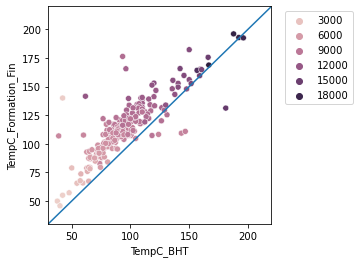

In [7]:
# plot the eaglebine temperature data
plt.close('all')
fig, ax = plt.subplots(1, 1, figsize=(4,4))

sns.scatterplot(data=Eaglebine_Combined_stat, x="TempC_BHT", y="TempC_Formation_Fin", hue='BHT_below sea level (ft)', ax=ax)

ax.set_xlim([30, 220])
ax.set_ylim([30, 220])
ax.plot([0, 220], [0, 220])
plt.legend(bbox_to_anchor=(1.04,1), loc="upper left")

## 2.2. Organize Duvernay temperature data

In [8]:
# Read in DST BHT input and "true temp" synthetic data
Duvernay_Truth = pd.read_excel(dir_duvernay+'Duvenay TrueTemp_Train.xlsx')
Duvernay_DST = pd.read_excel(dir_duvernay+'Duvernay DST BHT for SPE April 20 2021.xlsx')

# add in an extra column calculating the depth sub sea (elevation-depth)*-1 
Duvernay_DST['Depth_SS(m)']=-1*(Duvernay_DST['elevation M above sea level']-(Duvernay_DST['DST Start Depth (MD) (m)']+Duvernay_DST['DST End Depth (MD) (m)'])/2)

# merge
Duvernay_Combined = Duvernay_DST.merge(Duvernay_Truth, on='UWI', how='left')

display(Duvernay_DST.head(2))
display(Duvernay_Combined.head(2))

,Well ID,DST Start Depth (MD) (m),DST End Depth (MD) (m),DST Bottom Hole Temp. (degC),DST Test Date,Test Type,DST Misrun,DST Number,Formation DSTd,Unnamed: 9,elevation M above sea level,UWI,Depth_SS(m)
0,100010107020W500,1410.6,1423.4,48.33,1971-04-02,DST,N,2,TRmontney,NaN,701.0,100010107020W500,716.0
1,100010608109W500,1686.0,1694.0,34.26,1992-02-13,DST,N,1,Dmuskeg,NaN,645.6,100010608109W500,1044.4


,Well ID,DST Start Depth (MD) (m),DST End Depth (MD) (m),DST Bottom Hole Temp. (degC),DST Test Date,Test Type,DST Misrun,DST Number,Formation DSTd,Unnamed: 9,elevation M above sea level,UWI,Depth_SS(m),Depths subsea (m),True Temperature (oC)
0,100010107020W500,1410.6,1423.4,48.33,1971-04-02,DST,N,2,TRmontney,NaN,701.0,100010107020W500,716.0,-720.0,2.53
1,100010107020W500,1410.6,1423.4,48.33,1971-04-02,DST,N,2,TRmontney,NaN,701.0,100010107020W500,716.0,-700.0,2.54


In [9]:
# keep only the synthetic model temperature data for the relevant depths for which there is BHT measurement
Duvernay_Combined['diff_depth'] = Duvernay_Combined['Depth_SS(m)']-Duvernay_Combined['Depths subsea (m)']
Duvernay_Combined['diff_depth_abs'] = np.abs(Duvernay_Combined['diff_depth'])
idx = Duvernay_Combined.groupby(['UWI'])['diff_depth_abs'].transform(min) == Duvernay_Combined['diff_depth_abs']

TrueTempUWI = Duvernay_Combined.loc[idx, ['UWI', 'diff_depth_abs', 'True Temperature (oC)']]
TrueTempUWI = TrueTempUWI.copy(deep=True)
Duvernay_Combined_cln = Duvernay_DST.merge(TrueTempUWI, on='UWI', how='left')
Duvernay_Combined_cln = Duvernay_Combined_cln.drop_duplicates(['UWI'])
Duvernay_Combined_cln.head(2)

,Well ID,DST Start Depth (MD) (m),DST End Depth (MD) (m),DST Bottom Hole Temp. (degC),DST Test Date,Test Type,DST Misrun,DST Number,Formation DSTd,Unnamed: 9,elevation M above sea level,UWI,Depth_SS(m),diff_depth_abs,True Temperature (oC)
0,100010107020W500,1410.6,1423.4,48.33,1971-04-02,DST,N,2,TRmontney,NaN,701.0,100010107020W500,716.0,4.0,60.97
1,100010608109W500,1686.0,1694.0,34.26,1992-02-13,DST,N,1,Dmuskeg,NaN,645.6,100010608109W500,1044.4,4.4,63.98


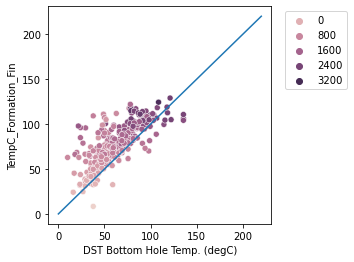

In [11]:
# Plot the temp data
plt.close('all')
fig, ax = plt.subplots(1, 1, figsize=(4,4))

sns.scatterplot(data=Duvernay_Combined_stat, 
                x="DST Bottom Hole Temp. (degC)",
                y="TempC_Formation_Fin",
                hue='Depth_SS(m)', ax=ax)

#ax.set_xlim([30, 220])
#ax.set_ylim([30, 220])
ax.plot([0, 220], [0, 220])
plt.legend(bbox_to_anchor=(1.04,1), loc="upper left")

## 2.3. Combine Eaglebine and Duvernay temperature datasets

In [12]:
Duvernay = Duvernay_Combined_stat[['UWI', 'DST Bottom Hole Temp. (degC)', 'TempC_Formation_Fin','Depth_SS(m)', 'TrueTemp_datasource']]
Duvernay = Duvernay.rename(columns={'DST Bottom Hole Temp. (degC)': 'BHT', 'TempC_Formation_Fin': 'TrueTemp'})
Duvernay['Field'] = 'Duvernay'

Eaglebine = Eaglebine_Combined_stat[['UWI', 'TempC_BHT', 'TempC_Formation_Fin', 'TD (ft)', 'TrueTemp_datasource']]
Eaglebine = Eaglebine.rename(columns={'TempC_BHT': 'BHT', 'TempC_Formation_Fin': 'TrueTemp'})
Eaglebine['Field'] = 'Eaglebine'

combined_temperature = pd.concat((Duvernay, Eaglebine))
display(combined_temperature.head(2))

# save this structured data to file
! mkdir StructuredData
combined_temperature.to_csv('StructuredData/combined_temperature.csv')

,UWI,BHT,TrueTemp,Depth_SS(m),TrueTemp_datasource,Field,TD (ft)
0,100010107020W500,48.33,60.97,716.0,synthetic_temp,Duvernay,NaN
1,100010608109W500,34.26,63.98,1044.4,synthetic_temp,Duvernay,NaN


A subdirectory or file StructuredData already exists.


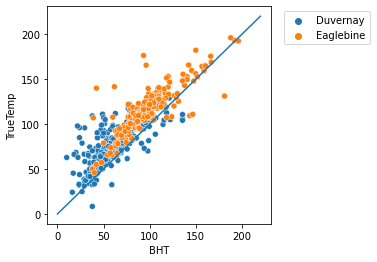

In [13]:
# Plot field temperatures
plt.close('all')
fig, ax = plt.subplots(1, 1, figsize=(4,4))

sns.scatterplot(data=combined_temperature, 
                x="BHT",
                y="TrueTemp",
                hue='Field', ax=ax)

ax.plot([0, 220], [0, 220])
plt.legend(bbox_to_anchor=(1.04,1), loc="upper left")

## 2.4. Organize Mud-weight, formation, well header, and production data

This section consolidates the files provided by TGS. List of imported files and the dataframe names:

- Eaglebine mud weight SPE April 21 2021.xlsx: **EB_MW**
- Eaglebine formation tops SPE April 20 2021.xlsx: **EB_FT**
- Eaglebine well headers SPE April 21 2021.xlsx: **EB_WH**
- SPE Eaglebine production summary April 20 2021.xlsx: **EB_PS**
- Duvernay formation tops SPE April 20 2021.xlsx: **DV_FT**
- Duvernay well headers SPE April 21 2021 .xlsx: **DV_WH**
- SPE Duvernay production summary April 20 2021.xlsx: **DV_PS**

**Workflow: add the multiple entries as attributes**

1. read the excel file into a dataframe. Leave the indexing out at this stage.
1. for each well number (Well_Id), tag the multiple entries in a new column.
    - New column name: 'attribute_' + the name of the column with multiple entries.
    - Tag: name of the column with multiple entries + sequential number for multiple entries in that column
1. reshape the featured table to pivot on the attribute
1. check for dupblicates on 'Well_Id' after reshaping. If duplicates exist inspect all columns for each well. If no duplicates, it's ready for merge


(Thanks Korang Modaressi for code)

In [14]:
files_to_upload = {'file': ['Eaglebine mud weight SPE April 21 2021.xlsx', 
                         'Eaglebine formation tops SPE April 20 2021.xlsx',
                         'Eaglebine well headers SPE April 21 2021.xlsx',
                         'SPE Eaglebine production summary April 20 2021.xlsx',
                         'Duvernay formation tops SPE April 20 2021.xlsx',
                         'Duvernay well headers SPE April 21 2021 .xlsx',
                         'SPE Duvernay production summary April 20 2021.xlsx'],
                  'df_name': ['EB_MW', 'EB_FT', 'EB_WH', 'EB_PS', 'DV_FT', 'DV_WH', 'DV_PS']}
files_to_upload['flat_df_name'] = [str(c) + '_flat' for c in files_to_upload['df_name']]
print(files_to_upload['flat_df_name'])
print(files_to_upload['df_name'][0][:2])

['EB_MW_flat', 'EB_FT_flat', 'EB_WH_flat', 'EB_PS_flat', 'DV_FT_flat', 'DV_WH_flat', 'DV_PS_flat']
EB


In [15]:
# EAGLEBINE DATA
# Import and organize mud weight
EB_MW = pd.read_excel(dir_eaglebine+"Eaglebine mud weight SPE April 21 2021.xlsx")
EB_MW.columns = [c.strip() for c in EB_MW.columns.values.tolist()]
EB_MW.rename(columns = {'UWI': 'Well_Id'}, inplace = True)

# Import and organize Formation tops
EB_FT = pd.read_excel(dir_eaglebine+"Eaglebine formation tops SPE April 20 2021.xlsx")
EB_FT.columns = [c.strip() for c in EB_FT.columns.values.tolist()]
EB_FT.rename(columns = {'UWI': 'Well_Id'}, inplace = True)
EB_FT['Well_Id'] = EB_FT['Well_Id'].astype(str)

# Import and organize Well head data
EB_WH = pd.read_excel(dir_eaglebine+"Eaglebine well headers SPE April 21 2021.xlsx")
EB_WH.rename(columns = {'displayapi': 'Well_Id'}, inplace = True)
EB_WH['Well_Id'] = EB_WH['Well_Id'].astype(str)

# Import and organize Production summary
EB_PS = pd.read_excel(dir_eaglebine+"SPE Eaglebine production summary April 20 2021.xlsx")
EB_PS.columns = [c.strip() for c in EB_PS.columns.values.tolist()]
EB_PS.rename(columns = {'API': 'Well_Id'}, inplace = True)


# DUVERNAY DATA
# Import and organize Formation tops
DV_FT = pd.read_excel(dir_duvernay+"Duvernay formation tops SPE April 20 2021.xlsx")
DV_FT.columns = [c.strip() for c in DV_FT.columns.values.tolist()]
DV_FT.rename(columns = {'UWI': 'Well_Id'}, inplace = True)

# Import and organize Well head data
DV_WH = pd.read_excel(dir_duvernay+"Duvernay well headers SPE April 21 2021 .xlsx")
DV_WH.columns = [c.strip() for c in DV_WH.columns.values.tolist()]
DV_WH.rename(columns = {'UWI': 'Well_Id'}, inplace = True)

# Import and organize Production summary
DV_PS = pd.read_excel(dir_duvernay+"SPE Duvernay production summary April 20 2021.xlsx")
DV_PS.columns = [c.strip() for c in DV_PS.columns.values.tolist()]
DV_PS.rename(columns = {'API': 'Well_Id'}, inplace = True)

print('All data read in')

All data read in


In [16]:
# Loop thorugh each well (Well_Id), convert each column into ndarray with Well_Id as key
# Useful functions definitions
''' list the unique well identifiers (Well_Id) in the table and the number of rows for each. The new dataframe will be used to populate the columns of the wide table'''
def wells_and_attributes(df):
    well_data = df
    columns = well_data.columns
    well_data_count = well_data['Well_Id'].value_counts()
    wells = well_data_count.index
    return well_data, wells, columns

''' 
The 'entry_to_attr' function collects the unique Well_Id and pivots entries under each Well_Id into attributes. 
The loop check for each unique well number in well_data_count, loops through columns and pivots the values in each column into a dataframe.
The name of the current column is used as prefix with an underscore "columnname_" joined with suffix as the index (from 0) of the entries for each well. 
The extracted variables are turned into dataframe and is concatenated with the existing dataframe from previous loop. 
'''
def entry_to_attr(df):
    well_data_flat = pd.DataFrame() #dataframe for storing well records after change to wide format
    well_data, wells, columns = wells_and_attributes(df) #read 'wells_and_attributes' function description
    for well in wells:
        well_data_intermediate_flat = pd.DataFrame() #temporary dataframe to store pivoted entries to new attributes for each original column
        well_data_filtered = well_data[well_data['Well_Id'] == well] #filterd for 'well' to start pivoting to new attributes
        #print(well_data_filtered)
        for column in columns: #pivots columns for each well into new attributes
            if column == 'Well_Id': #ignores the Well_Id and flattens othe columns
                continue
            else:
                att_vars = np.array(well_data_filtered[column]) #array containing entries in 'column' for 'well'
                att_count = len(att_vars) #number of entries in the array used for naming the new columns
                att_names = [column+"_"+str(x) for x in range(att_count)] #new column name with number of entries (att_count array's length) as suffix
                well_data_intermediate = pd.DataFrame(att_vars).T #intermediate flat table to be merged with the temporary dataframe
                well_data_intermediate.columns = att_names
                index = pd.Index([well], name = 'Well_Id')
                well_data_intermediate.index = index
                well_data_intermediate_flat = pd.concat([well_data_intermediate_flat, well_data_intermediate], axis = 1)
        well_data_flat = pd.concat([well_data_flat, well_data_intermediate_flat])
    return well_data_flat

In [17]:
'''
In this loop the entry_to_attr funciton is looped for the dataframes:
    'EB_MW', 'EB_FT', 'EB_WH', 'EB_PS', 'DV_FT', 'DV_WH', 'DV_PS'
The resulting wide-format dataframe is stored in a new datafram. 
The wide-format dataframes are concatenated into one dataframe with Well_ID as index
'''
dataframes = [EB_MW, EB_FT, EB_WH, EB_PS, DV_FT, DV_WH, DV_PS]
consolidated_well_data = pd.DataFrame()
cols = []
rows = []
# consolidated_well_data = pd.concat([consolidated_well_data, dataframes[0], dataframes[1], dataframes[2]])
for i in range(len(dataframes)): #
    well_data_flat = entry_to_attr(dataframes[i])
    well_data_flat['Basin'] = files_to_upload['df_name'][i][:2]
    well_data_flat.reset_index(inplace = True)
    well_data_flat.to_excel(str(str(files_to_upload['flat_df_name'][i]) + '.' + 'xlsx'))
    print(well_data_flat.shape)
    well_data_flat.set_index(['Well_Id', 'Basin'], inplace = True)
    consolidated_well_data = pd.concat([consolidated_well_data, well_data_flat], axis = 1)
consolidated_well_data.shape
display(consolidated_well_data.head(2))
print('the consolidated_well_data has {} rows and {} columns'.format(consolidated_well_data.shape[0], consolidated_well_data.shape[1]))

(316, 54)
(324, 30)
(324, 17)
(308, 90)
(512, 22)
(512, 13)
(512, 25)


,,TD_0,TD_1,TD_2,TD_3,TD_4,TD_5,TD_6,TD_7,TD_8,TD_9,...,Elevation Ground (ft)_0,Elevation Kelly Bushing (ft)_0,Last Production Month_0,Gas Maximum (mcf)_0,Gas Maximum Date_0,Oil Maximum (bbl)_0,Oil Maximum Date_0,Water Maximum (bbl)_0,Water Maximum Date_0,Yield Total Average_0
Well_Id,Basin,,,,,,,,,,,,,,,,,,,,,
42013301410000,EB,19629.0,19629.0,19629.0,19629.0,19629.0,19629.0,19629.0,19629.0,19629.0,19629.0,...,NaN,NaN,NaT,NaN,NaT,NaN,NaT,NaN,NaT,NaN
42013310190000,EB,11000.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaT,NaN,NaT,NaN,NaT,NaN,NaT,NaN


the consolidated_well_data has 1160 rows and 237 columns


In [18]:
# Write consolidated data to csv/excel
consolidated_well_data_no_index = consolidated_well_data.reset_index()
consolidated_well_data.to_csv('StructuredData/consolidated_well_data.csv')
consolidated_well_data.to_excel('StructuredData/consolidated_well_data.xlsx')

## 2.5. Organize LAS file

In [19]:
### Thanks to Pushpesh Sharma for writing this section
#Load all files at once into las and las_df to save time
folder='Data/Clean_LAS/'
all_files = os.listdir(folder)
n_files = len(all_files)

bad_files = []

las = {}
las_df = {}
mnemonics ={}
i=0
for filename in tqdm(os.listdir(folder)):
    i=i+1
    if filename.endswith(".LAS"):
        las[filename] = lasio.read(folder+'/'+filename)
        las_df[filename] = las[filename].df()
        mnemonics[filename] = las_df[filename].columns

  0%|          | 0/1498 [00:00<?, ?it/s]

In [20]:
#find out which well curves/logs are in each las file
listDF = []
for filename in tqdm(all_files):
    df = pd.DataFrame(columns = list(mnemonics[filename]), data = np.ones((1,len(mnemonics[filename]))))
    df['well_name']=filename
    listDF.append(df)

  0%|          | 0/1498 [00:00<?, ?it/s]

In [21]:
# Here we can see which logs are in each well
log_table=pd.concat(listDF)
display(log_table.head(2))

# see what are the most common log types
sumT = log_table.drop(columns=['well_name']).sum()
sumT.sort_values(ascending=False)


# make a table of the log types available per well
for filename in all_files:
    las_df[filename] = las_df[filename].rename_axis('DEPT').reset_index()

,CALSED,CALWS,CONDWS,DRESWS,DTED,DTWS,GRSED,GRWS,ILDED,ILMED,...,AF90,AF10ED,AF90ED,DPHZED,TNPHED,CHTD,ARFL,ASGU,LL3ED,LL3
0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [24]:
# we can extract the gamma ray values [GRWS] at 
# regular intervals to add to the dataset (every 300 ft)
WellLog = 'GRWS'

select_depth = list(np.arange(300, 30300, 300))
new_las_df = {}
extracted_df = {}
j = 0
fncnt = 0
for filename in tqdm(all_files):
    fncnt = fncnt+1

    las_df[filename] = las_df[filename].sort_values(by='DEPT')
    p = las_df[filename]
    new_las_df[filename] = p[p['DEPT'].isin(select_depth)]
    if(WellLog not in list(new_las_df[filename].columns)):
      continue
    q = new_las_df[filename][WellLog]
    Depth = new_las_df[filename]['DEPT']
    
    concat_list = list()
    column_name = list()
    for i in range(0,q.shape[0]):
        concat_list.append(q.iloc[i])
        column_name.append(str(Depth.iloc[i])+'_'+WellLog)
        
    concat_array = np.array(concat_list)
    concat_array = np.reshape(concat_array,(1,len(concat_list)))
    df = pd.DataFrame(concat_array, columns=column_name)
    df['WellName'] = filename[2:16]
    if filename[-5] == 'W':
        df['LogType'] = 'Cleaned'
    else:
        df['LogType'] = 'Raw'
    extracted_df[j] = df
    j = j+1

  0%|          | 0/1498 [00:00<?, ?it/s]

In [25]:
# Combine dataset and write to file
LargeDF = pd.concat(extracted_df)
LargeDF.to_csv('StructuredData/LogData.csv')

## 2.6. Combine all data sources together

In [26]:
TemperatureData = pd.read_csv('StructuredData/combined_temperature.csv')
HeaderData = pd.read_csv('StructuredData/consolidated_well_data.csv')
LogData = pd.read_csv('StructuredData/LogData.csv')

Combined1 = TemperatureData.merge(HeaderData, how='left', left_on='UWI', right_on='Well_Id')
LogData['WellName']=LogData['WellName'].astype('str')
Combined1['UWI']=Combined1['UWI'].astype('str')
LogData = LogData.drop_duplicates(['WellName'])
Combined2 = Combined1.merge(LogData, how='left', left_on='UWI', right_on='WellName')
display(Combined2.head(2))

print('There are ' + str(len(Combined2)) + ' rows and ' + str(len(Combined2.columns) ) + ' columns in the dataframe')

,Unnamed: 0_x,UWI,BHT,TrueTemp,Depth_SS(m),TrueTemp_datasource,Field,TD (ft),Well_Id,Basin,...,21300.0_GRWS,21600.0_GRWS,21900.0_GRWS,22200.0_GRWS,22500.0_GRWS,22800.0_GRWS,23100.0_GRWS,23400.0_GRWS,23700.0_GRWS,24000.0_GRWS
0,0,100010107020W500,48.33,60.97,716.0,synthetic_temp,Duvernay,NaN,100010107020W500,DV,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,100010608109W500,34.26,63.98,1044.4,synthetic_temp,Duvernay,NaN,100010608109W500,DV,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


There are 1160 rows and 331 columns in the dataframe


### Notes
- There are 331 columns (potential features) and 1160 rows in this final dataset.
- Multiple columns are the same, example TD, KB, from various files. 
- Many of the log columns are the same data for the individual wells with different names. These can be coalesced.
- Instead of doing an EDA on this dataset, we will use a more efficient method: Narrow down the columns and find what is most important to a future model.

---

# 2.1. Organize data, continued
- We will attempt to colaesce the logs to the most common: `GR`, `Bulk Density`, `Neutron Porosity`, `Resistivity`, `Sonic`.
- We will also attempt to extract a time since circulation stopped and surface temperatures from the LAS headers
- In addition, `Duvernay` data does not contain time since circulation but we can extract an "equilibrium time" from the DST pressure test

## 2.7. Wrangle Log data

In [213]:
# Define functions

# Define function to get mud temperature (proxy for surface temperature)
def mstfunc(msts): 
    if "MST" and "DATE" and "CLNT" not in las[i].params:
        mst_value=np.nan
    elif "MST" and "DATE" not in las[i].params:
        mst_value=np.nan
    elif "MST" not in las[i].params:
        mst_value=np.nan
    else:
        mst_value=las[i].params["MST"].value
    return mst_value

# Define function to get the unit of mud temperature 
def mstunitfunc(msts): 
    if "MST" and "DATE" and "CLNT" not in las[i].params:
        mst_unit=np.nan
    elif "MST" and "DATE" not in las[i].params:
        mst_unit=np.nan
    elif "MST" not in las[i].params:
        mst_unit=np.nan
    else:
        mst_unit=las[i].params["MST"].unit
    return mst_unit

# Define function to get the time since circulations from LAS files (start)
def tcsfunc(file): 
    if "TCS" not in las[i].params:
        tcs_value=np.nan
    else:
        tcs_value=las[i].params["TCS"].value
    return tcs_value

 # Define function to get the time since circulations from LAS files (end)
def tlabfunc(file):
    if "TLAB" not in las[i].params:
        tlab_value=np.nan
    else:
        tlab_value=las[i].params["TLAB"].value
    return tlab_value

In [214]:
# Extract parameters from LAS files using lists 
uwi=[]
ctry=[]
mst=[]
mstunit=[]
tsc=[]
tlab=[]
curves_list=[]
first_point=[]
sec_point=[]
third_point=[]
i=0
for i in las:
    uwi.append(las[i].well["UWI"].value)
    ctry.append(las[i].well["CTRY"].value)
    mst.append(mstfunc(i))
    mstunit.append(mstunitfunc(i))
    tsc.append(tcsfunc(i))
    tlab.append(tlabfunc(i))
    curves=las[i].df()
    curves["UWI"]= las[i].well["UWI"].value
    curves["CTRY"]= las[i].well["CTRY"].value
    #curves["Depth"]=curves.set_index
    curves_list.append(curves)
    #curves["Vsh"]=(curves[""])
    first_point.append(curves.iloc[[-1]])
    sec_point.append(curves.iloc[[-2]])    
    third_point.append(curves.iloc[[-3]]) 

#Creat DataFrame (UWI, Country, TS, tlab, tsc, Temp Unit)
prm={} 
prm["UWI"]=uwi
prm["CTRY"]=ctry
prm["MST"]=mst
prm["Unit"]=mstunit
prm["tsc"]=tsc
prm["tlab"]=tlab
prm=pd.DataFrame.from_records(prm)
prm=prm.drop_duplicates()
prm.index=prm["UWI"]
display(prm.head(2))
prm.shape

,CTRY,MST,UWI,Unit,tlab,tsc
UWI,,,,,,
100010107020W500,CANADA,61.0,100010107020W500,DEGF,NaN,3.0
100010608109W500,CANADA,20.0,100010608109W500,DEGC,1400,800.0


(858, 6)

In [215]:
# There are more wells than given, indicating still more duplicates are present

# Create & view duplicates set
duplicates=prm.duplicated(subset="UWI", keep=False)
duplicated_uwi=prm[duplicates==True]
display(duplicated_uwi.shape)

# Drop specific rows
prm.dropna(how="all",subset=["MST", "tlab","tsc"],inplace=True)
duplicates=prm.duplicated(subset="UWI", keep=False)
duplicated_uwi=prm[duplicates==True]
display(duplicated_uwi.head(2))

# Replace values to eliminate duplicates
prm.loc["42285307220000",["tlab","tsc"]]=[530,330]
prm.drop(["100103604301W500", "42127315740000", "42283002040000", "42285307220000"], axis=0, inplace=True)
duplicates=prm.duplicated(subset="UWI", keep=False)
duplicated_uwi=prm[duplicates==True]
print(duplicated_uwi)

(44, 6)

,CTRY,MST,UWI,Unit,tlab,tsc
UWI,,,,,,
100103604301W500,CANADA,50.0,100103604301W500,DEGF,NaN,6.0
100103604301W500,CANADA,NaN,100103604301W500,NaN,NaN,6.0


Empty DataFrame
Columns: [CTRY, MST, UWI, Unit, tlab, tsc]
Index: []


In [216]:
#Fix labels on Unit column
prm["Unit"]=prm["Unit"].replace("DEGFC","DEGC")
prm["Unit"]=prm["Unit"].replace("C","DEGC")
prm["Unit"]=prm["Unit"].replace("F","DEGF")
prm["Unit"]=prm["Unit"].replace("FT","DEGF")

#Converting MST Temperature to degrees Celsious by creating a new column
prm["T_surf_C"]=np.where(prm["Unit"]=="DEGF",(prm["MST"]-32)*(5/9),prm["MST"])
prm.head(2)

,CTRY,MST,UWI,Unit,tlab,tsc,T_surf_C
UWI,,,,,,,
100010107020W500,CANADA,61.0,100010107020W500,DEGF,NaN,3.0,16.111111
100010608109W500,CANADA,20.0,100010608109W500,DEGC,1400,800.0,20.000000


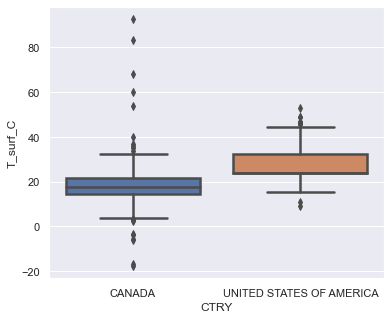

In [217]:
# Perform some EDA

#Look for outliers, surface temperature
sns.set(rc={"figure.figsize":(6, 5)})
sns.boxplot(x="CTRY", y="T_surf_C", data=prm, linewidth=2.5)
xlabel="Surface Temperature (C)"
ylabel="Country"

In [218]:
print(prm.groupby('CTRY')['T_surf_C'].median())
print(prm.groupby('CTRY')['T_surf_C'].mean())
print(prm.groupby('CTRY')['T_surf_C'].std())

CTRY
CANADA                      17.777778
UNITED STATES OF AMERICA    23.888889
Name: T_surf_C, dtype: float64
CTRY
CANADA                      18.352734
UNITED STATES OF AMERICA    28.184014
Name: T_surf_C, dtype: float64
CTRY
CANADA                      8.692682
UNITED STATES OF AMERICA    7.383205
Name: T_surf_C, dtype: float64


<AxesSubplot:xlabel='CTRY', ylabel='T_surf_C'>

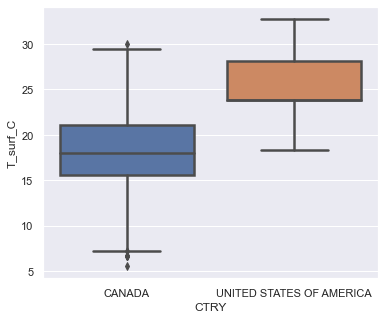

In [219]:
#Analyzing outliers greater than mean
up_outliers=prm[prm["T_surf_C"]>30] 
# up_outliers.head(20)

#replacing values outliers for Duvernay with median 
prm.loc[(prm['CTRY'] == 'CANADA') & (prm['T_surf_C'] > 30), 'T_surf_C'] = 18.352734 
prm.loc[(prm['CTRY'] == 'CANADA') & (prm['T_surf_C'] < 5.5), 'T_surf_C'] = 18.352734 

#replacing values outliers for Eaglebine with median 
prm.loc[(prm['CTRY'] == 'UNITED STATES OF AMERICA') & (prm['T_surf_C'] > 33), 'T_surf_C'] = 28.184014
prm.loc[(prm['CTRY'] == 'UNITED STATES OF AMERICA') & (prm['T_surf_C'] < 18), 'T_surf_C'] = 28.184014

sns.boxplot(x="CTRY", y="T_surf_C", data=prm, linewidth=2.5)

<class 'pandas.core.frame.DataFrame'>
Index: 816 entries, 100010107020W500 to 42507326870000
Data columns (total 7 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   CTRY      816 non-null    object 
 1   MST       712 non-null    float64
 2   UWI       816 non-null    object 
 3   Unit      712 non-null    object 
 4   tlab      349 non-null    float64
 5   tsc       779 non-null    float64
 6   T_surf_C  712 non-null    float64
dtypes: float64(4), object(3)
memory usage: 83.3+ KB


<AxesSubplot:xlabel='CTRY', ylabel='r_tsc_hrs'>

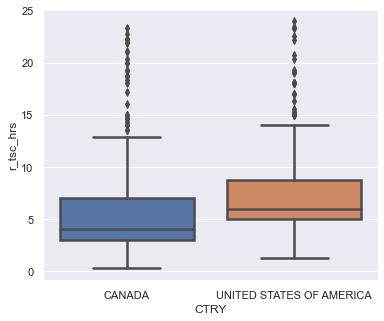

In [220]:
#Converting tlab (time logger at bottom) column to float
prm["tlab"]=prm["tlab"].replace("12:00",1200)
prm["tlab"]=prm["tlab"].replace("-",np.nan)
prm.info()

#Cleaning tlab column by replacing values because of typos
prm["tlab"]=prm["tlab"].replace(30,300)
prm["tlab"]=prm["tlab"].replace(50,500)
prm["tlab"]=prm["tlab"].replace(15,150)
prm["tlab"]=prm["tlab"].replace(5,500)
prm["tlab"]=prm["tlab"].replace(3,300)

#Creating tsc_aux column to simplify real tsc calculations
prm["tsc_aux"]=np.where(prm["tsc"]<10,prm["tsc"]*100,prm["tsc"]) #Coverting all values with the same range of digits if apply
prm.fillna({"tlab":0}, inplace=True) #replacing missing values in Tlab for simplicity

#Creating columns r_tsc_hrs with real tsc values  
conditions_tsc=[(prm["tlab"]<prm["tsc_aux"]) & (prm["tlab"]>90), (prm["tlab"]>prm["tsc_aux"]), (prm["tlab"]==0) & (prm["tsc_aux"]>90),(prm["tsc_aux"]<90) & (prm["tlab"]==0)]
values_tsc=[((prm["tlab"]+2400-prm["tsc_aux"])/100),((prm["tlab"]-prm["tsc_aux"])/100),(prm["tsc_aux"]/100),(prm["tsc_aux"])]
prm["r_tsc_hrs"]=np.select(conditions_tsc,values_tsc)

#replace NAN values with data from excel file "Eaglebine BHT TSC data..."
prm.loc[1054,["r_tsc_hrs"]]=[19]
prm.loc[1062,["r_tsc_hrs"]]=[15]
prm.loc[1075,["r_tsc_hrs"]]=[6]
prm.loc[1187,["r_tsc_hrs"]]=[3.5]
prm.loc[1289,["r_tsc_hrs"]]=[24]
prm.loc[1122,["r_tsc_hrs"]]=[8]
prm.loc[1398,["r_tsc_hrs"]]=[4.8]
prm.loc[1444,["r_tsc_hrs"]]=[3]
prm.loc[1469,["r_tsc_hrs"]]=[11]
#prm[prm["r_tsc_hrs"]<1].head(50)

# Time since circulation stopped
#Replacing 0 values using mean
prm['r_tsc_hrs'] = prm.groupby(['CTRY'])['r_tsc_hrs'].apply(lambda x: x.replace(0,x.median()))
prm[prm["r_tsc_hrs"]<1].head()


#Replacing outliers
prm['r_tsc_hrs'].nlargest(3)

 # replace outliers by reasonable values (using domain knowledge)
prm.loc["100102506527W500",["r_tsc_hrs"]]=4.5
prm.loc["42127317560000",["r_tsc_hrs"]] = 3
prm.loc["100052206625W500",["r_tsc_hrs"]] = 3

sns.boxplot(x="CTRY", y="r_tsc_hrs", data=prm, linewidth=2.5)

In [221]:

# Creating data frame with wells and log curve values at the TD 
first_point=pd.concat(first_point)
sec_point=pd.concat(sec_point)
third_point=pd.concat(third_point)

# Set index
first_point=first_point.set_index(["UWI"])
sec_point=sec_point.set_index(["UWI"])
third_point=third_point.set_index(["UWI"])

last_point=first_point.combine_first(sec_point)
last_point=last_point.combine_first(third_point)
display(last_point.shape)

#droping duplicates by wells
last_point=last_point.reset_index()
last_point=last_point.drop_duplicates(subset="UWI")

#last_point=last_point.set_index(["Depth","UWI","CTRY"])
last_point=last_point.set_index(["UWI","CTRY"])
display(last_point.head(2))

 #droping columns with all values as NaN
last_point=last_point.dropna(axis=1, how="all")
last_point.shape

 #separating data by country
grouped_CTRY=last_point.groupby(["CTRY"])
CA_log=grouped_CTRY.get_group("CANADA",last_point)
USA_log=grouped_CTRY.get_group("UNITED STATES OF AMERICA",last_point)

display(CA_log.shape)
display(USA_log.shape)

(1498, 794)

,,CALSED,CALWS,CONDWS,DRESWS,DTED,DTWS,GRSED,GRWS,ILDED,ILMED,...,AF90,AF10ED,AF90ED,DPHZED,TNPHED,CHTD,ARFL,ASGU,LL3ED,LL3
UWI,CTRY,,,,,,,,,,,,,,,,,,,,,
100010107020W500,CANADA,7.5523,7.5523,350.5943,2.8523,62.3776,62.3776,17.4082,17.4082,2.8523,3.5691,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
100010608109W500,CANADA,NaN,206.3909,35.8591,27.8869,NaN,NaN,NaN,21.8775,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


(512, 482)

(324, 482)

In [222]:
# Duvernay data, drop NaN, replace outlier values

CA_log=CA_log.dropna(axis=1, how="all")
drops_CA=CA_log.dropna(axis=1, thresh=1)
drops_CA.isna().sum()
drops_CA.isna().sum()

drops_CA["BoreHole D"]=drops_CA[["CALDED","CALSED","CALWS"]].mean(skipna=True, axis=1)#Borehole values
drops_CA["Resistivity"]=drops_CA[["CILDED", "DRESWS", "ILDED", "LL8ED", "MRESWS", "SNED", "SRESWS"]].max(skipna=True, axis=1)#resistivity
drops_CA["Bulk Density"]=drops_CA[["DCORWS", "DENWS", "DRHOED", "RHOBED", "DENWS"]].max(skipna=True, axis=1)#bulk density 
drops_CA["Sonic"]=drops_CA[["DTED","DTWS", "DTCO"]].max(skipna=True, axis=1)#sonic
drops_CA["Neutron Porosity"]=drops_CA[["NPHILSED", "NPOLSWS", "NEUTWS", "NPHISSED"]].max(skipna=True, axis=1)#Neutron porosity
drops_CA["GR"]=drops_CA[["GRDED", "GRSED","GRWS","GRRED"]].mean(skipna=True, axis=1)#gamma ray
Canada_log=drops_CA[["BoreHole D","Resistivity","Bulk Density", "Sonic","Neutron Porosity","GR"]]


res=Canada_log['Resistivity'].nlargest(3)
neu=Canada_log['Neutron Porosity'].nlargest(1)
gr=Canada_log['GR'].nlargest(1)
display(res)
display(neu)
display(gr)

Canada_log.loc[Canada_log["Resistivity"]>2900,["Resistivity"]]=77.456600 #replacing value with median 
Canada_log.loc[10800.0,["Neutron Porosity"]]=0.104650 #replacing value with median
#Canada_log.loc[Canada_log["Bulk Density"]<100,["Bulk Density"]]
Canada_log.loc[(Canada_log['Bulk Density']<100), 'Bulk Density'] = (Canada_log['Bulk Density'])*1000 #Correcting values of bulk density because of units
Canada_log.loc[Canada_log["GR"]>400,["GR"]]=80.151724 #replacing value with mean 
Canada_log["GR"].fillna(Canada_log["GR"].median(), inplace=True)
Canada_log["Sonic"].fillna(Canada_log["Sonic"].median(), inplace=True)
Canada_log["Resistivity"].fillna(Canada_log["Resistivity"].median(), inplace=True)
Canada_log["BoreHole D"].fillna(Canada_log["BoreHole D"].mean(), inplace=True)
Canada_log.loc[Canada_log["Neutron Porosity"]>2000,["Neutron Porosity"]]=0.104650 #replacing value with median
Canada_log=Canada_log.reset_index()
display(Canada_log.head(2))

UWI               CTRY  
100132405522W500  CANADA    48488.7852
100073405315W500  CANADA    40399.8281
100042606601W600  CANADA    10507.6445
Name: Resistivity, dtype: float64

UWI               CTRY  
100063405415W500  CANADA    9722.4629
Name: Neutron Porosity, dtype: float64

UWI               CTRY  
100031508009W500  CANADA    365.712867
Name: GR, dtype: float64

,UWI,CTRY,BoreHole D,Resistivity,Bulk Density,Sonic,Neutron Porosity,GR
0,100010107020W500,CANADA,7.5523,11.1929,NaN,62.37760,NaN,17.4082
1,100010608109W500,CANADA,206.3909,38.0683,2872.9292,68.24595,0.0692,21.8775


In [223]:
# Eaglebine data, drop NaN, replace outlier values

USA_log=USA_log.dropna(axis=1, how="all")
drops_USA=USA_log.dropna(axis=1, thresh=1)
drops_USA.isna().sum()

drops_USA["BoreHole D"]=drops_USA[["CALD", "CALR", "DCAL"]].mean(skipna=True, axis=1)#Borehole values
drops_USA["Resistivity"]=drops_USA[["AF60", "ILD", "ILM", "SFLU", "CILD", "RILD", "RILM"]].mean(skipna=True, axis=1)#resistivity
drops_USA["Bulk Density"]=drops_USA[["DRHO", "RHOB", "CORR", "DEN"]].max(skipna=True, axis=1)#bulk density 
drops_USA["Sonic"]=drops_USA[["DT" ]].max(skipna=True, axis=1)#sonic
drops_USA["Neutron Porosity"]=drops_USA[["NPHI_LS", "NPHI"]].max(skipna=True, axis=1)#Neutron porosity
drops_USA["GR"]=drops_USA[["GRR", "GRD", "GR", "GRN"]].max(skipna=True, axis=1)#gamma ray
#drops_USA["Density Porosity"]=drops_USA[["DPHI_LS", "DPHI","NEUT"]].max(skipna=True, axis=1)#density porosity
USA_log=drops_USA[["BoreHole D","Resistivity","Bulk Density", "Sonic","Neutron Porosity","GR"]]

#Replacing values 
USA_log.loc[USA_log["Bulk Density"]<0,["Bulk Density"]]=USA_log["Bulk Density"]*(-1)
USA_log.loc[USA_log["BoreHole D"]<0,["BoreHole D"]]=USA_log["BoreHole D"]*(-1)
USA_log.loc[USA_log["BoreHole D"]<1,["BoreHole D"]]= 7.729350 #median
USA_log.loc[USA_log["Neutron Porosity"]<0,["Neutron Porosity"]]=USA_log["Neutron Porosity"]*(-1)
USA_log.loc[USA_log["GR"]<0,["GR"]]=USA_log["GR"]*(-1)
USA_log["BoreHole D"].fillna(USA_log["BoreHole D"].median(), inplace=True)
USA_log["GR"].fillna(USA_log["GR"].median(), inplace=True)
USA_log["Resistivity"].fillna(USA_log["Resistivity"].median(), inplace=True)
USA_log=USA_log.reset_index()
display(USA_log.head(2))

,UWI,CTRY,BoreHole D,Resistivity,Bulk Density,Sonic,Neutron Porosity,GR
0,42013301410000,UNITED STATES OF AMERICA,6.0281,21.65990,2.7783,48.9178,NaN,34.79420
1,42013301930000,UNITED STATES OF AMERICA,7.0612,32.39675,2.3503,NaN,NaN,30.23385


In [233]:
# Create basin grouping to extract curves
T_group=prm.groupby(["CTRY"])

CA_prm=T_group.get_group("CANADA", prm)
CA_prm=CA_prm.drop("UWI", axis=1)
CA_prm=CA_prm.reset_index()
USA_prm=T_group.get_group("UNITED STATES OF AMERICA",prm)
USA_prm=USA_prm.drop("UWI", axis=1)
USA_prm=USA_prm.reset_index()

#Extract columns to concact
CA_prm=CA_prm.get(["UWI","T_surf_C","r_tsc_hrs"])
CA_logs=Canada_log.get(["UWI","Resistivity","Bulk Density", "Sonic", "Neutron Porosity","GR"])
Duvernay_log_data=pd.concat([CA_logs,CA_prm], join="outer",axis=1)
Duvernay_log_data["UWI"].astype('str')
USA_prm=USA_prm.get(["UWI","T_surf_C","r_tsc_hrs"])
USA_logs=USA_log.get(["UWI","Resistivity","Bulk Density", "Sonic", "Neutron Porosity","GR"])
Eaglebine_log_data=pd.concat([USA_logs,USA_prm], join="outer",axis=1)
Eaglebine_log_data["UWI"].astype('str')

# Fill NaN with means
Duvernay_log_data["T_surf_C"].fillna(Duvernay_log_data["T_surf_C"].mean())
Duvernay_log_data["r_tsc_hrs"].fillna(Duvernay_log_data["r_tsc_hrs"].mean())
Eaglebine_log_data["T_surf_C"].fillna(Eaglebine_log_data["T_surf_C"].mean())
Eaglebine_log_data["r_tsc_hrs"].fillna(Eaglebine_log_data["r_tsc_hrs"].mean())

Final_logs = pd.concat((Duvernay_log_data, Eaglebine_log_data))
Final_logs.columns = ['UWI', 'Resistivity', 'Bulk Density', 'Sonic', 'Neutron Porosity', 'GR', 'Well_id', 'T_surf_C', 'r_tsc_hrs']
display(Final_logs.head(2))

,UWI,Resistivity,Bulk Density,Sonic,Neutron Porosity,GR,Well_id,T_surf_C,r_tsc_hrs
0,100010107020W500,11.1929,NaN,62.37760,NaN,17.4082,100010107020W500,16.111111,3.0
1,100010608109W500,38.0683,2872.9292,68.24595,0.0692,21.8775,100010608109W500,20.000000,6.0


### Notes
- Performed some EDA: **`Eaglebine`** temperatures are generally higher than **`Duvernay`**
- There is a lot of missing data for `Neutron Porosity`, `Sonic`, and `Bulk Density`
- Did not fill log curve NaN, this will be done using other means if necessary to be used
- Surface temperatures and time since circulation were filled with means


## 2.8. Wrangle DST "TSC" 

In [167]:
# Import DST pressure data, getting well static time
Duvernay_DST_Press = pd.read_excel(dir_duvernay+'Duvernay DST Pressures SPE May 2 2021.xlsx')

# Calculate sub sea depth for dataset (elevation-depth)*-1, convert to feet. 
Duvernay_DST_Press['DST_Depth_SS(m)']=-1*(Duvernay_DST_Press['KB Elev (m)']-(Duvernay_DST_Press['DST Start Depth (MD) (m)']+Duvernay_DST_Press['DST End Depth (MD) (m)'])/2)
Duvernay_DST_Press['Depth_SS(ft)'] = Duvernay_DST_Press['DST_Depth_SS(m)']*3.28084
Duvernay_DST_Press['Shut in time (hrs)'] = (Duvernay_DST_Press['1st Shut-in Time'].fillna(0)
                                           +Duvernay_DST_Press['2nd Shut-in Time'].fillna(0)
                                           +Duvernay_DST_Press['1st Valve Open Time'].fillna(0)
                                           +Duvernay_DST_Press['2nd Valve Open Time'].fillna(0)
                                           +Duvernay_DST_Press['3rd Valve Open Time'].fillna(0)
                                           +Duvernay_DST_Press['3rd Shut-in Time'].fillna(0))/60

Duvernay_Combined_DST = Duvernay_Combined_stat.merge(Duvernay_DST_Press[['Well ID', 'Shut in time (hrs)', 'DST_Depth_SS(m)', 'Depth_SS(ft)']], on='Well ID', how='left')
Duvernay_Combined_DST.head(2)

,Well ID,DST Start Depth (MD) (m),DST End Depth (MD) (m),DST Bottom Hole Temp. (degC),DST Test Date,Test Type,DST Misrun,DST Number,Formation DSTd,Unnamed: 9,...,Well_ID,Depth (ft),Temp (degC),Field,TrueTemp_datasource_stat,TempC_Formation_Fin,TrueTemp_datasource,Shut in time (hrs),DST_Depth_SS(m),Depth_SS(ft)
0,100010107020W500,1410.6,1423.4,48.33,1971-04-02,DST,N,2,TRmontney,NaN,...,NaN,NaN,NaN,NaN,NaN,60.97,synthetic_temp,3.550000,716.0,2349.081440
1,100010608109W500,1686.0,1694.0,34.26,1992-02-13,DST,N,1,Dmuskeg,NaN,...,NaN,NaN,NaN,NaN,NaN,63.98,synthetic_temp,4.033333,1044.4,3426.509296


---

### Notes
- Looking through the other columns, we need to select single columns for TD, elevation, formation tops, X/Y and Lat/Long, in addition to temperatures, logs.
- Production data not selected as it not relevant to BHT of the well. It will be used for geothermal evaluation
- Mud weight not used as it is not present in `Duvernay`

In [168]:
# Read in  well header data and formation tops,
# Merge X/Y coordinates into combined files
Duvernay_feat1 = Duvernay_Combined_DST.merge(DV_FT[['Well_Id', 'Bottom Hole Location X_m_NAD27_Zone 11N (120 W to 114 W)', 'Bottom Hole Location Y_m_NAD27_Zone 11N (120 W to 114 W)']], left_on='Well ID', right_on='Well_Id', how='left')
Eaglebine_feat1 = Eaglebine_Combined_stat.merge(EB_FT[['Well_Id', 'Bottom_Hole_Location_X', 'Bottom_Hole_Location_Y']], left_on='UWI', right_on='Well_Id', how='left')
Eaglebine_feat1.tail(2)

,UWI,SurfLat,SurfLong,TD (ft),GL(ft),BHT_below sea level (ft),BHT_ subsurface (ft),BHTorMRT (maximum recorded temperature) oF,TSC or ORT (time since circulation or original recorded time in hours),TempC_BHT,...,Well_ID,Depth (ft),Temp (degC),Field,TrueTemp_datasource_stat,TempC_Formation_Fin,TrueTemp_datasource,Well_Id,Bottom_Hole_Location_X,Bottom_Hole_Location_Y
322,42507312960000,29.075911,-100.006371,7191.0,839.85,6329.55,7169.4,153.0,9.0,67.222222,...,NaN,NaN,NaN,NaN,NaN,94.794444,synthetic_temp,42507312960000,1678556.34,453171.98
323,42507326870000,29.001905,-99.586898,4016.0,787.90,3246.50,4034.4,122.0,4.0,50.000000,...,42507326870000,4016.0,78.888889,Eaglebine,static_temp_logs,78.888889,static_temp_logs,42507326870000,1812507.42,425263.32


In [39]:
# Merge in surface latitude/longitude
Duvernay_feat2 = Duvernay_feat1.merge(DV_WH[['Well_Id', 'TD meters', 'Elevation Meters', 'BottomLatitude_NAD83', 'BottomLongitude_NAD83', 'SurfaceLatitude_NAD83', 'SurfaceLongitude_NAD83']], left_on='Well ID', right_on='Well_Id', how='left')
Duvernay_feat2['TD ft'] = Duvernay_feat2['TD meters']*3.28084
Eaglebine_feat2 = Eaglebine_feat1.merge(EB_WH[['Well_Id', 'td', 'Elevation', 'BottomLatitude_NAD83', 'BottomLongitude_NAD83', 'SurfaceLatitude_NAD83', 'SurfaceLongitude_NAD83']], left_on='UWI', right_on='Well_Id', how='left')
Eaglebine_feat2['BHT_SS(FT)'] = Eaglebine_feat2['TD (ft)']-Eaglebine_feat2['Elevation']
display(Duvernay_feat2.head(2))
display(Eaglebine_feat2.tail(2))

,Well ID,DST Start Depth (MD) (m),DST End Depth (MD) (m),DST Bottom Hole Temp. (degC),DST Test Date,Test Type,DST Misrun,DST Number,Formation DSTd,Unnamed: 9,...,Bottom Hole Location X_m_NAD27_Zone 11N (120 W to 114 W),Bottom Hole Location Y_m_NAD27_Zone 11N (120 W to 114 W),Well_Id_y,TD meters,Elevation Meters,BottomLatitude_NAD83,BottomLongitude_NAD83,SurfaceLatitude_NAD83,SurfaceLongitude_NAD83,TD ft
0,100010107020W500,1410.6,1423.4,48.33,1971-04-02,DST,N,2,TRmontney,NaN,...,506245.60,6097691.89,100010107020W500,2767.6748,701.093481,55.027981,-116.903553,55.027981,-116.903553,9080.298191
1,100010608109W500,1686.0,1694.0,34.26,1992-02-13,DST,N,1,Dmuskeg,NaN,...,600487.16,6205637.53,100010608109W500,1745.0000,645.600000,55.987511,-115.390554,55.987511,-115.390554,5725.065800


,UWI,SurfLat,SurfLong,TD (ft),GL(ft),BHT_below sea level (ft),BHT_ subsurface (ft),BHTorMRT (maximum recorded temperature) oF,TSC or ORT (time since circulation or original recorded time in hours),TempC_BHT,...,Bottom_Hole_Location_X,Bottom_Hole_Location_Y,Well_Id_y,td,Elevation,BottomLatitude_NAD83,BottomLongitude_NAD83,SurfaceLatitude_NAD83,SurfaceLongitude_NAD83,BHT_SS(FT)
322,42507312960000,29.075911,-100.006371,7191.0,839.85,6329.55,7169.4,153.0,9.0,67.222222,...,1678556.34,453171.98,42507312960000,7191,821.45,29.077015,-100.006558,29.077015,-100.006558,6369.55
323,42507326870000,29.001905,-99.586898,4016.0,787.90,3246.50,4034.4,122.0,4.0,50.000000,...,1812507.42,425263.32,42507326870000,4016,766.44,29.001905,-99.586898,29.001905,-99.586898,3249.56


In [238]:
# Combine datasets
Duvernay_bas = Duvernay_feat2[['Well ID', 
                               'Depth_SS(m)', 
                                   'Shut in time (hrs)', 
                                   'DST Bottom Hole Temp. (degC)',
                                   'TrueTemp_datasource',
                                   'TempC_Formation_Fin', 
                                   'Bottom Hole Location X_m_NAD27_Zone 11N (120 W to 114 W)', 
                                   'Bottom Hole Location Y_m_NAD27_Zone 11N (120 W to 114 W)',
                                   'TD meters', 
                                   'Elevation Meters', 
                                   'BottomLatitude_NAD83', 
                                   'BottomLongitude_NAD83', 
                                   'SurfaceLatitude_NAD83',
                                   'SurfaceLongitude_NAD83']]
Duvernay_bas = Duvernay_bas.rename(columns={'Well ID': 'UWI', 
                                            'Depth_SS(m)': 'BHT_Depth', 
                                            'Shut in time (hrs)': 'Shut in time_hrs', 
                                            'DST Bottom Hole Temp. (degC)': 'BHT_C',
                                            'TempC_Formation_Fin': 'TrueTemp', 
                                            'Bottom Hole Location X_m_NAD27_Zone 11N (120 W to 114 W)': 'x_coordinate', 
                                            'Bottom Hole Location Y_m_NAD27_Zone 11N (120 W to 114 W)':  'y_coordinate',
                                            'TD meters': 'TD', 
                                            'Elevation Meters': 'KB Elevation'})
Duvernay_bas['Field'] = 'Duvernay'

Eaglebine_bas = Eaglebine_feat2[['UWI', 
                                 'BHT_SS(FT)', 
                                 'TSC or ORT (time since circulation or original recorded time in hours)', 
                                 'TempC_BHT', 
                                 'TrueTemp_datasource', 
                                 'TempC_Formation_Fin', 
                                 'Bottom_Hole_Location_X', 
                                 'Bottom_Hole_Location_Y', 
                                 'TD (ft)', 
                                 'Elevation', 
                                 'BottomLatitude_NAD83',
                                 'BottomLongitude_NAD83', 
                                 'SurfaceLatitude_NAD83', 
                                 'SurfaceLongitude_NAD83']]
Eaglebine_bas = Eaglebine_bas.rename(columns={'BHT_SS(FT)':'BHT_Depth',
                                              'TSC or ORT (time since circulation or original recorded time in hours)': 'Shut in time_hrs', 
                                              'TempC_BHT': 'BHT_C', 
                                              'TempC_Formation_Fin': 'TrueTemp', 
                                              'Bottom_Hole_Location_X': 'x_coordinate', 
                                              'Bottom_Hole_Location_Y':  'y_coordinate', 
                                              'TD (ft)': 'TD', 
                                              'Elevation' : 'KB Elevation'})
Eaglebine_bas['Field'] = 'Eaglebine'

full_data = pd.concat((Duvernay_bas, Eaglebine_bas))
full_data.tail(2)

,UWI,BHT_Depth,Shut in time_hrs,BHT_C,TrueTemp_datasource,TrueTemp,x_coordinate,y_coordinate,TD,KB Elevation,BottomLatitude_NAD83,BottomLongitude_NAD83,SurfaceLatitude_NAD83,SurfaceLongitude_NAD83,Field
322,42507312960000,6369.55,9.0,67.222222,synthetic_temp,94.794444,1678556.34,453171.98,7191.0,821.45,29.077015,-100.006558,29.077015,-100.006558,Eaglebine
323,42507326870000,3249.56,4.0,50.000000,static_temp_logs,78.888889,1812507.42,425263.32,4016.0,766.44,29.001905,-99.586898,29.001905,-99.586898,Eaglebine


In [235]:
Final_logs.columns

Index(['UWI', 'Resistivity', 'Bulk Density', 'Sonic', 'Neutron Porosity', 'GR',
       'Well_id', 'T_surf_C', 'r_tsc_hrs'],
      dtype='object')

In [240]:
# Combine final dateset for use
combined_full_data = full_data.merge(Final_logs[['UWI', 'Resistivity', 'Bulk Density', 'Sonic', 'Neutron Porosity', 'GR', 'T_surf_C', 'r_tsc_hrs']], on='UWI', how='left')
display(combined_full_data.sample(2))
display(combined_full_data.info())


,UWI,BHT_Depth,Shut in time_hrs,BHT_C,TrueTemp_datasource,TrueTemp,x_coordinate,y_coordinate,TD,KB Elevation,...,SurfaceLatitude_NAD83,SurfaceLongitude_NAD83,Field,Resistivity,Bulk Density,Sonic,Neutron Porosity,GR,T_surf_C,r_tsc_hrs
586,42051309360000,7818.38,10.5,79.444444,static_temp_logs,117.055556,2724480.23,958881.12,8227.0,408.62,...,30.450949,-96.701282,Eaglebine,91.7812,0.0439,NaN,0.0077,25.1821,28.184014,6.0
776,42293304520000,14056.11,4.0,62.222222,synthetic_temp,NaN,2845455.45,1310760.29,14500.0,443.89,...,31.410831,-96.291481,Eaglebine,101.0762,2.5702,NaN,0.0036,47.6741,NaN,6.0


<class 'pandas.core.frame.DataFrame'>
Int64Index: 836 entries, 0 to 835
Data columns (total 22 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   UWI                     836 non-null    object 
 1   BHT_Depth               836 non-null    float64
 2   Shut in time_hrs        836 non-null    float64
 3   BHT_C                   836 non-null    float64
 4   TrueTemp_datasource     836 non-null    object 
 5   TrueTemp                615 non-null    float64
 6   x_coordinate            836 non-null    float64
 7   y_coordinate            836 non-null    float64
 8   TD                      836 non-null    float64
 9   KB Elevation            836 non-null    float64
 10  BottomLatitude_NAD83    820 non-null    float64
 11  BottomLongitude_NAD83   820 non-null    float64
 12  SurfaceLatitude_NAD83   820 non-null    float64
 13  SurfaceLongitude_NAD83  820 non-null    float64
 14  Field                   836 non-null    ob

None

### Notes
- We have now narrowed down the columns to a more manageable number: 22 columns, 836 rows
- Formation tops were filled in (in excel) and evaluated in the feature importance but found not to have much of an impact so the wrangling was not coded into the notebook
- We will now explore the dataset

---

# 3. EDA

### 3.1. Basic EDA

Total and Percentage of NaN:
                         Total  Percent
bulk_density              362     43.3
neutron_porosity          361     43.2
sonic                     221     26.4
truetemp                  221     26.4
t_surf_c                  124     14.8
r_tsc_hrs                  20      2.4
bottomlatitude_nad83       16      1.9
surfacelongitude_nad83     16      1.9
surfacelatitude_nad83      16      1.9
bottomlongitude_nad83      16      1.9


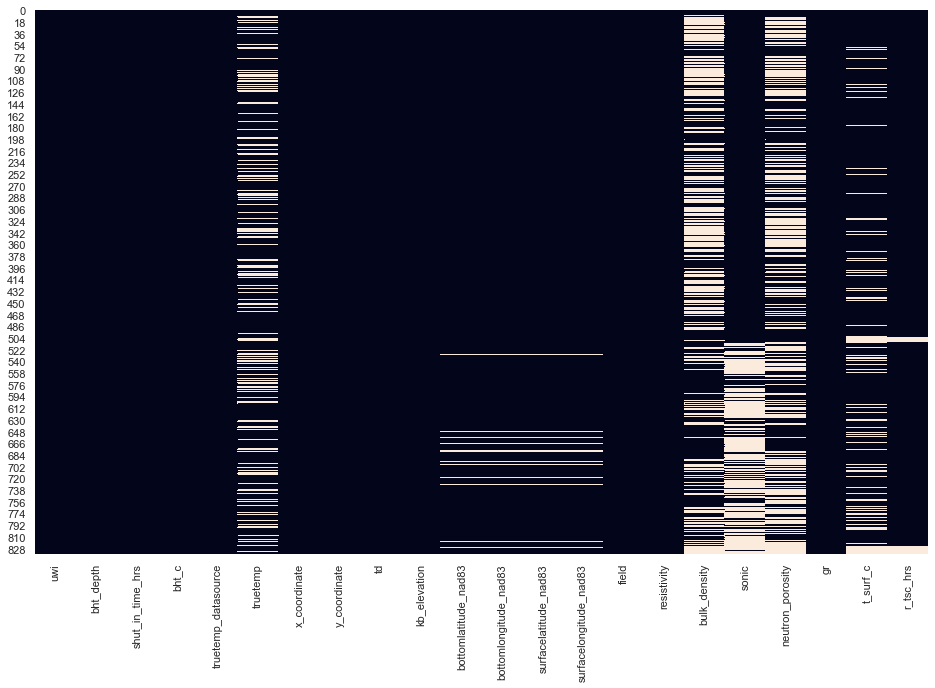

In [241]:
clean_column_headers(combined_full_data)
missing_data(combined_full_data)

            bht_c    truetemp     bht_depth            td  x_coordinate  \
count  604.000000  604.000000    604.000000    604.000000  6.040000e+02   
mean    74.211238   90.482233   4302.316689   5728.513094  1.311806e+06   
std     29.560458   29.695735   4505.434876   3887.735774  9.785766e+05   
min     10.000000    8.370000   -630.950000   1280.506810  3.990139e+05   
25%     50.560000   66.945000    862.575000   2937.019616  5.272531e+05   
50%     71.670000   90.145000   1691.575000   3596.406545  6.206101e+05   
75%     91.467500  110.575000   7878.002500   8304.250000  2.454913e+06   
max    196.111111  196.027778  23666.020000  24037.000000  3.053167e+06   

       y_coordinate  surfacelatitude_nad83  surfacelongitude_nad83  \
count  6.040000e+02             604.000000              604.000000   
mean   3.999995e+06              44.926072             -108.848815   
std    2.565818e+06              11.892594                9.153807   
min    1.280686e+05              28.185137  

,uwi,field
count,604,604
unique,604,2
top,100101306920W500,Duvernay
freq,1,372


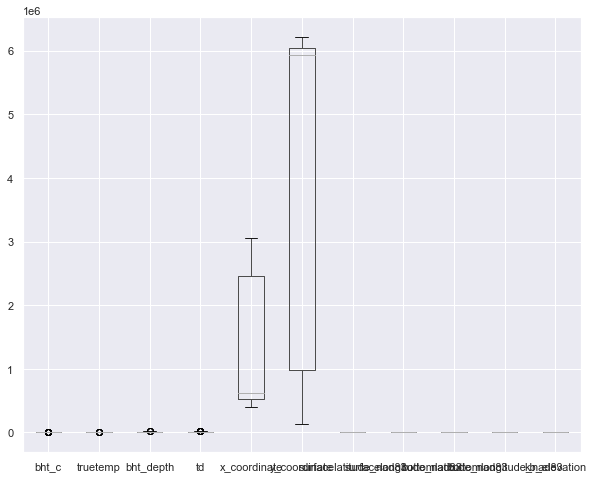

In [242]:
data.boxplot(figsize=(10, 8))
print(data.describe())
data.describe(include='object')

array([[<AxesSubplot:title={'center':'bht_c'}>,
        <AxesSubplot:title={'center':'truetemp'}>,
        <AxesSubplot:title={'center':'bht_depth'}>],
       [<AxesSubplot:title={'center':'td'}>,
        <AxesSubplot:title={'center':'x_coordinate'}>,
        <AxesSubplot:title={'center':'y_coordinate'}>],
       [<AxesSubplot:title={'center':'surfacelatitude_nad83'}>,
        <AxesSubplot:title={'center':'surfacelongitude_nad83'}>,
        <AxesSubplot:title={'center':'bottomlatitude_nad83'}>],
       [<AxesSubplot:title={'center':'bottomlongitude_nad83'}>,
        <AxesSubplot:title={'center':'kb_elevation'}>, <AxesSubplot:>]],
      dtype=object)

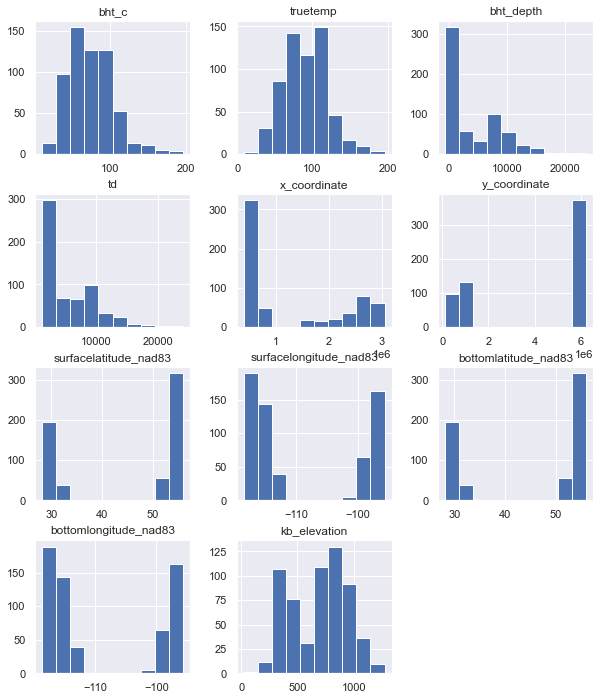

In [243]:
# Distribution of Numerical data
data.select_dtypes(include=['number']).hist(figsize= (10,12))

### Well locations were plotted in QGIS for the `Duvernay` and `Eaglebine` basins

<img src="Wells.jpg">

<AxesSubplot:>

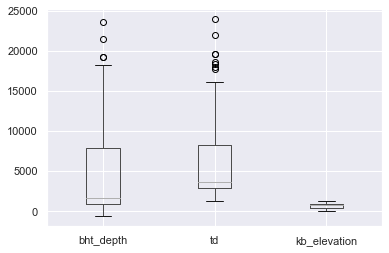

In [296]:
data[['bht_depth', 'td', 'kb_elevation']].boxplot(figsize=(6, 4))

# While there appear to be outliers in the depths/temperatures, this could be normal as values can vary widely

<AxesSubplot:>

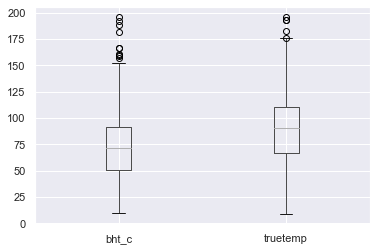

In [299]:
data[['bht_c', 'truetemp']].boxplot(figsize=(6, 4))

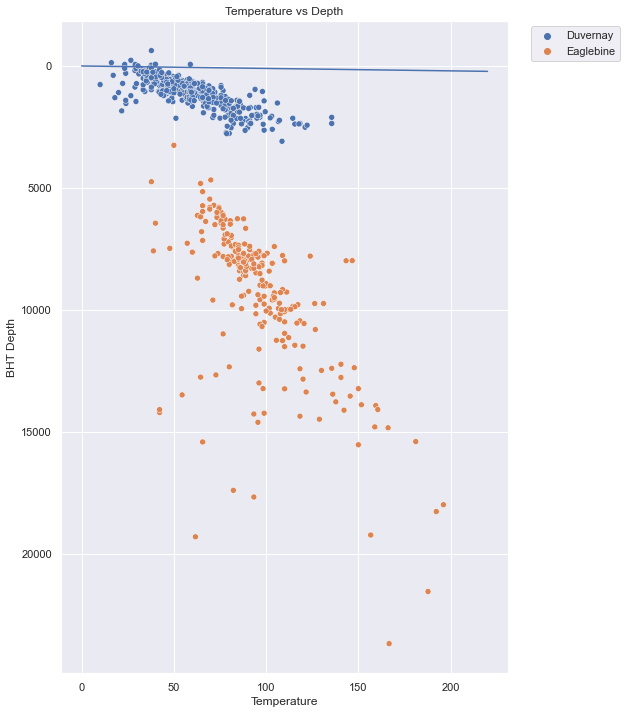

In [310]:
# Plot temperatures vs depth
for f in np.sort(data.field.unique()):
    plt.close('all')
    fig, ax = plt.subplots(1, 1, figsize=(8,12))
    sns.scatterplot(data=data, x="bht_c", y="bht_depth", ax=ax, hue='field')
    plt.xlabel('Temperature')
    plt.ylabel('BHT Depth')
    plt.title('Temperature vs Depth')
    plt.gca().invert_yaxis()
    ax.plot([0, 220], [0, 220])
    plt.legend(bbox_to_anchor=(1.04,1), loc="upper left")

### 3.2. Perform Feature importance

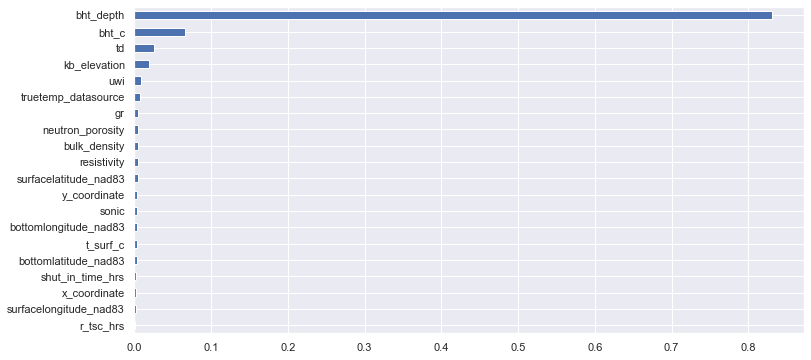

In [245]:

from sklearn.ensemble import RandomForestRegressor
feat_file = combined_full_data.dropna()

# Encode categorical columns
cat_cols = ['uwi', 'truetemp_datasource', 'field']
for col in cat_cols:
    feat_file[col] = LabelEncoder().fit_transform(feat_file[col])

X_feat = feat_file.select_dtypes(exclude=['object']).drop(['truetemp'], axis=1)
y_feat = feat_file['truetemp']
y_feat = y_feat.astype('int32')

# Fit Features Classifier model
feat_model = RandomForestRegressor()
#feat_model = ExtraTreesClassifier()
feat_model.fit(X_feat, y_feat)

#plot graph of feature importances for better visualization
feat_importance = pd.Series(feat_model.feature_importances_, index=X_feat.columns)
feat_importance.nlargest(20).sort_values().plot(kind='barh', figsize=(12,6))
plt.show()

### Notes
- From basic EDA, almost half of Bulk density & Neutron values are missing
- 26% of True Temperatures are missing
- There is normal distribution of Temperatures
- From feature imporatance, unsuprisignly, BHT Temperature and depth have the greatest impact on True Temperature
- Suprisingly, shut in time has minimal effect
- The plot of temperature vs depth shows a "temperature gradient" as expected, `Duvernay` values are lower than `Eaglebine`
  - Note: `Duvernay` depth is in meters
- Note also, Temperatures are tightly clustered at shallower depths but fan out with depth. This may be an issue for predictions later on

---

# 4. Modeling
### 4.1 Import models

In [246]:
# Import scalers, scores, params estimators
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold, cross_val_predict, cross_val_score, GridSearchCV, RandomizedSearchCV
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder, LabelEncoder, RobustScaler
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error, mean_absolute_error
from sklearn.utils import shuffle

# Import Models
from sklearn.linear_model import LinearRegression, Lasso, ridge_regression
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, ExtraTreesClassifier
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from pykrige.rk import RegressionKriging

<AxesSubplot:>

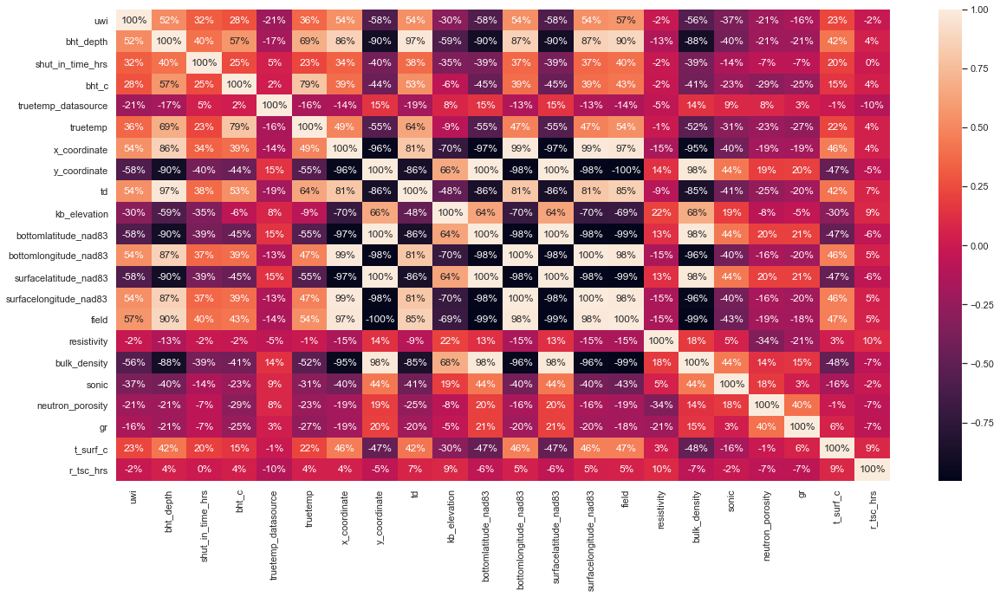

In [247]:
# Visualize correlation for Numerical columns
corr = feat_file.corr()
plt.figure(figsize= (20,10)) #adjust size to fit plots (width, height)
sns.heatmap(corr, annot=True, fmt ='.0%')

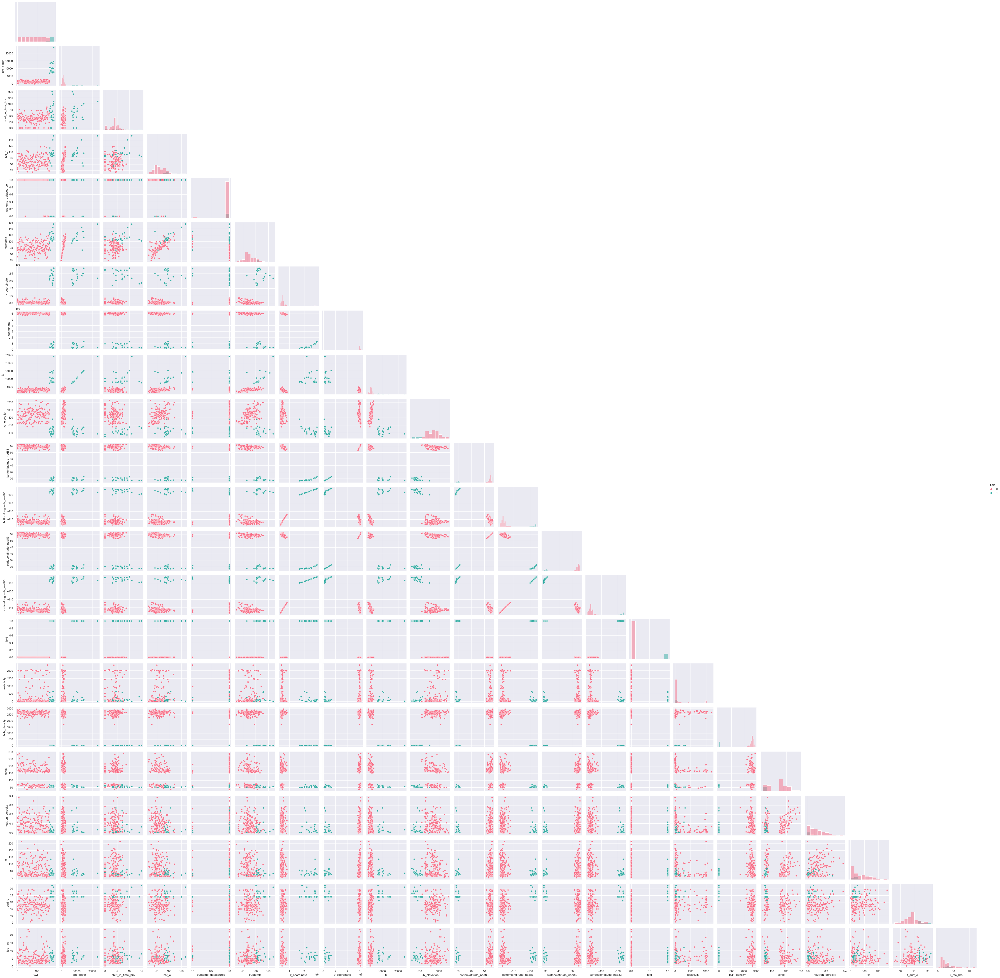

In [250]:
# Pair plot for correlation type
drop_cols = ['t_surf_c', 'r_tsc_hrs', 'bottomlatitude_nad83', 'bottomlongitude_nad83', 'surfacelatitude_nad83', 'surfacelongitude_nad83']
pair_cols = list(feat_file.select_dtypes(exclude=['object']).columns)
#pair_cols = [i for i in pair_cols if i not in drop_cols]

ax=sns.pairplot(feat_file, vars=pair_cols, 
                kind='scatter', diag_kind='hist', hue='field', 
                palette='husl', height=2.5, corner=True)

### Features to use for model
- Features that show the most impact and correlations: `BHT`, `BHT_Depth`, `TD`, `Lat/Long`, `Field`, `Bulk density`
- We tried to use a regression model to inpute missing values for `Bulk density` but it appeared to degrade the model, so it was removed from the features and code was deleted.
- We noticed that `bulk density` was highly correlated with `y-coordinate` so it was substituted.
- Missing NaN was deleted especially for `True Temp`: This is the target train, trying to impute through some method may introduce unnecessary errors 
- We used **RobustScaler** to scale the data; while we do not want to remove the outliers if present, we want to minimize any outsize impact from them

---

### 4.2 Compare models

In [252]:
# Set some parameters
seed = 25
RS = RobustScaler()
#cat_cols = ['formation']
model_set = ['uwi', 'bht_c', 'truetemp', 'bht_depth', 'td', 'x_coordinate', 'y_coordinate', 'field', 'surfacelatitude_nad83', 'surfacelongitude_nad83', 'bottomlatitude_nad83', 'bottomlongitude_nad83', 'kb_elevation']#, 'formation']#, 'gr', 'resistivity', 'formation', 'bulk_density']#, 'shut_in_time_hrs', 'bulk_density', 
feature_cols = ['bht_c', 'bht_depth', 'td', 'y_coordinate']#, 'bulk_density']#, 'resistivity']
data = pre_data[model_set]

# Clean NaN, Encode categoricals
data.dropna(inplace=True)
#data['formation'] = LabelEncoder().fit_transform(data['formation'])
display(data.head(2))

,uwi,bht_c,truetemp,bht_depth,td,x_coordinate,y_coordinate,field,surfacelatitude_nad83,surfacelongitude_nad83,bottomlatitude_nad83,bottomlongitude_nad83,kb_elevation
0,100010107020W500,48.33,60.97,716.0,2767.6748,506245.60,6097691.89,Duvernay,55.027981,-116.903553,55.027981,-116.903553,701.093481
1,100010608109W500,34.26,63.98,1044.4,1745.0000,600487.16,6205637.53,Duvernay,55.987511,-115.390554,55.987511,-115.390554,645.600000


LR: -0.0991 (0.0364)
SVR: -0.1499 (0.0880)
CART: -0.1174 (0.0243)
RF: -0.0864 (0.0251)
XGR: -0.0845 (0.0304)
LGBM: -0.0854 (0.0348)
Lasso: -0.0996 (0.0369)


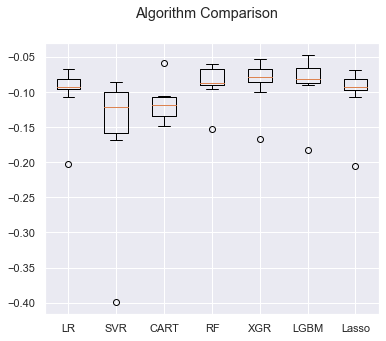

LR: -0.0703 (0.0223)
SVR: -0.0899 (0.0370)
CART: -0.0673 (0.0212)
RF: -0.0621 (0.0253)
XGR: -0.0648 (0.0253)
LGBM: -0.0725 (0.0345)
Lasso: -0.0745 (0.0247)


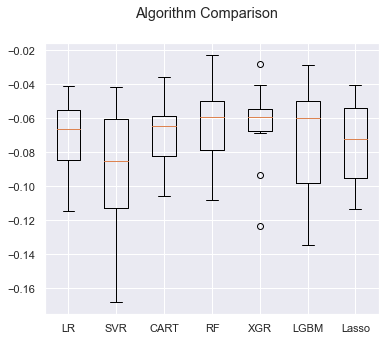

In [253]:

for f in np.sort(data.field.unique()):
    data_split = data[data.field.values==f].copy()
    X = data_split[feature_cols].values
    y = data_split['truetemp'].values
    X, y = shuffle(X, y, random_state = seed)
    
    X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.15,random_state=seed)
    X_train = RS.fit_transform(X_train)
    y_train = y_train.reshape(-1,1)
    X_test = RS.transform(X_test)
    y_test = y_test.reshape(-1,1)

    # Create list of models
    models = []
    models.append(('LR', LinearRegression()))
    models.append(('SVR', SVR()))
    models.append(('CART', DecisionTreeRegressor()))
    models.append(('RF', RandomForestRegressor()))
    models.append(('XGR', XGBRegressor()))
    models.append(('LGBM', LGBMRegressor()))
    models.append(('Lasso', Lasso(alpha=0.1)))
    #models.append(('Ridge', ridge_regression(X_train, y_train, alpha=0.1)))

    # Model the data
    results = []
    names = []
    scoring = 'neg_mean_absolute_percentage_error'
    for name, model in models:
        kfold = KFold(n_splits=10, random_state=seed, shuffle=True) 
        cv_results = cross_val_score(model, X_train, y_train, cv=kfold, scoring=scoring)
        results.append(cv_results)
        names.append(name)
        model_scores = "%s: %0.4f (%0.4f)" % (name, cv_results.mean(), cv_results.std())
        print(model_scores)

    # boxplot algorithm comparison
    fig = plt.figure()
    fig.suptitle('Algorithm Comparison')
    ax = fig.add_subplot(111)
    plt.boxplot(results)
    ax.set_xticklabels(names)
    plt.show()


- We performed an algorithm comparison then delved into the most accurate with better parameters. In the end chose RandomForest
- We also incorporated a kriging model to account for spatial values but that degraded the model

### 4.2 Separate into the training and validation/testing sets

In [255]:
set_split = pd.read_csv('Data/set_assign.csv')
display(set_split.head(2))

Combined3 = Combined2.merge(set_split, on='UWI', how='left')
display(Combined3.shape)

,UWI,Set
0,42021301990000,Validation_Testing
1,100102606420W500,Validation_Testing


In [266]:
filterTraining = Combined3['Set']=='Training'
Combined3[filterTraining].to_csv('training.csv', index=False)

filterTesting = Combined3['Set']=='Validation_Testing'
Combined3[filterTesting].to_csv('val_data_no_label.csv', index=False)

In [283]:
train = pd.read_csv('training_copy.csv')
test_data = pd.read_csv('val_data_no_label.csv')
test_data.head(3)

,Unnamed: 0_x,UWI,BHT,TrueTemp,Depth_SS(m),TrueTemp_datasource,Field,TD (ft),Well_Id,Basin,...,21600.0_GRWS,21900.0_GRWS,22200.0_GRWS,22500.0_GRWS,22800.0_GRWS,23100.0_GRWS,23400.0_GRWS,23700.0_GRWS,24000.0_GRWS,Set
0,8,100012404516W502,93.33,NaN,2333.1,synthetic_temp,Duvernay,NaN,100012404516W502,DV,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Validation_Testing
1,10,100012805703W500,37.00,NaN,533.2,synthetic_temp,Duvernay,NaN,100012805703W500,DV,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Validation_Testing
2,16,100020206419W500,82.22,NaN,1742.8,synthetic_temp,Duvernay,NaN,100020206419W500,DV,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Validation_Testing


### 4.3 Model

In [166]:
# Define functions for plotting results

def plot_scatter(x, y, **kwargs):
    size=kwargs.setdefault('size',4)
    marker=kwargs.setdefault('marker','o')
    label=kwargs.setdefault('label','')
    #x_label=kwargs.setdefault('x_label','')
    #y_label=kwargs.setdefault('y_label','')
    #title=kwargs.setdefault('title','')
    plt.scatter(x, y, marker=marker, s=size, label=label)
    plt.ylim(y.min(), y.max())
    plt.gca().invert_yaxis()
    plt.xlabel(x_label)
    plt.ylabel(y_label)
    plt.title(title)
    plt.legend()  

def plot_result(y_test, y_pred, mae, rmse, name):
    fig = plt.figure(figsize=(8.0, 6.0))
    plt.scatter(y_test, y_pred)
    plt.xlabel('Real BHT')
    plt.ylabel('Predicted BHT')
    lims = [np.min([plt.gca().get_xlim(), plt.gca().get_ylim()]),
            np.max([plt.gca().get_xlim(), plt.gca().get_ylim()]),  # max of both axes
           ]    
    # now plot both limits against eachother
    plt.plot(lims, lims, 'r--', alpha=0.75, zorder=0)
    plt.gca().set_xlim(lims)
    plt.gca().set_ylim(lims)
    fig.suptitle('Basin: {:s} MAE = {:.3f}, RMSE = {:.5f}'.format(name,mae, rmse), weight='bold', fontsize=15)


Duvernay field

Fitting 3 folds for each of 100 candidates, totalling 300 fits
Best: -82.538005 using {'n_estimators': 400, 'min_samples_split': 5, 'min_samples_leaf': 2, 'max_features': 'sqrt', 'max_depth': 70, 'bootstrap': False}
       mae means                                             params
rank                                                               
1     -82.538005  {'n_estimators': 400, 'min_samples_split': 5, ...
2     -82.698835  {'n_estimators': 200, 'min_samples_split': 5, ...
3     -83.303799  {'n_estimators': 500, 'min_samples_split': 2, ...
4     -83.341003  {'n_estimators': 900, 'min_samples_split': 2, ...
5     -83.359015  {'n_estimators': 400, 'min_samples_split': 2, ...
...          ...                                                ...
96   -138.903301  {'n_estimators': 100, 'min_samples_split': 10,...
97   -140.327345  {'n_estimators': 700, 'min_samples_split': 5, ...
98   -140.354248  {'n_estimators': 500, 'min_samples_split': 5, ...
99   -140.397292  {

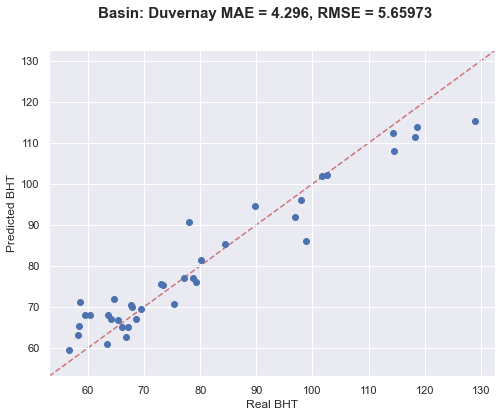

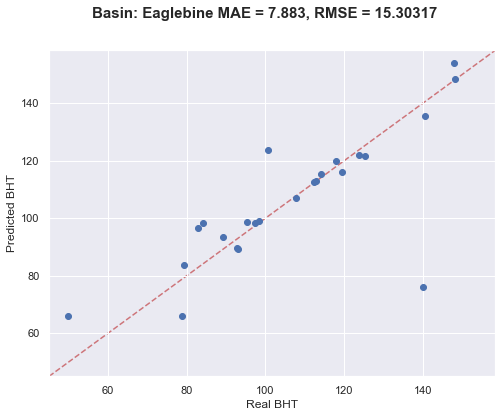

In [165]:
# Run scale and X/y split so no need to re-run model comparison each time

for f in np.sort(data.field.unique()):
    data_split = data[data.field.values==f].copy()
    X = data_split[feature_cols].values
    y = data_split['truetemp'].values
    X, y = shuffle(X, y, random_state = seed)
    
    X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.1,random_state=seed)
    X_train = RS.fit_transform(X_train)
    y_train = y_train.reshape(-1,1)
    X_test = RS.transform(X_test)
    y_test = y_test.reshape(-1,1)


    estimator = RandomForestRegressor()
    n_iter = 100
    kfold = 3

    n_estimators = range(100, 1000, 100)
    max_features = ['auto', 'sqrt']
    max_depth = range(10, 100, 10)
    min_samples_split = [2, 5, 10]
    min_samples_leaf = [1, 2, 4]
    bootstrap = [True, False]
    
    param_grid = {'n_estimators' : n_estimators,
                  'max_features' : max_features, 
                  'max_depth' : max_depth, 
                  'min_samples_split' : min_samples_split, 
                  'min_samples_leaf' : min_samples_leaf, 
                  'bootstrap' : bootstrap}

    model = RandomizedSearchCV(estimator = estimator, 
                               param_distributions = param_grid, 
                               n_iter = n_iter, 
                               scoring = 'neg_mean_squared_error', 
                               n_jobs = 1, 
                               refit='neg_mean_squared_error',
                               cv = kfold, 
                               verbose = 1, 
                               random_state = seed)

    print('\n%s field\n' % f)
    
    model.fit(X_train,y_train)
    
    # summarize results
    print("Best: %f using %s" % (model.best_score_, model.best_params_))
    results = pd.DataFrame({'rank': model.cv_results_['rank_test_score'], 
                            'mae means': model.cv_results_['mean_test_score'],
                            'params': model.cv_results_['params'] })
    
    results.set_index('rank', inplace=True)#
    results.sort_index(inplace=True)
    print(results)
        
    y_pred = model.predict(X_test)
    
    #test the accuracy
    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    mape = mean_absolute_percentage_error(y_test, y_pred)
    print("\nMAE score: %.2f" % mae, "Root Mean squared error: %.2f" % rmse, "Mean absolute percentage error: %.2f" % mape)
    plot_result(y_test, y_pred, mae, rmse, f) 

In [70]:

for f in np.sort(data.field.unique()):
    data_split = data[data.field.values==f].copy()
    X_train = data_split[feature_cols].values
    y_train = data_split['truetemp'].values
    #X_Y_train = data_split[['x_coordinate', 'y_coordinate']].to_numpy()
    #Y_Z_train = data_split[['bottomlatitude_nad83', 'bottomlongitude_nad83', 'td', 'kb_elevation']].to_numpy()
    
    if str(f).startswith('Duvernay'):
        param = {'n_estimators': 500, 'min_samples_split': 2, 'min_samples_leaf': 2, 'max_features': 'sqrt', 'max_depth': 50, 'bootstrap': False}
    elif str(f).startswith('Eaglebine'):
        param = {'n_estimators': 200, 'min_samples_split': 10, 'min_samples_leaf': 2, 'max_features': 'auto', 'max_depth': 20, 'bootstrap': True}

    print('\n%s Formation\n' % f)
    
    Regressor = RandomForestRegressor(n_estimators= param['n_estimators'], 
                                      max_features= param['max_features'],  
                                      max_depth= param['max_depth'],  
                                      min_samples_split= param['min_samples_split'],  
                                      min_samples_leaf= param['min_samples_leaf'],  
                                      bootstrap= param['bootstrap'])

    
    Regressor.fit(RS.fit_transform(X_train), y_train)

    validate = pd.read_csv("Data/val_data_no_label_tony's_test.csv")
    val_split = validate[validate.Field.values==f].copy()
    X_val = val_split[['BHT', 'Depth_SS(m)', 'Bottom_Y', 'TD (ft)']].to_numpy()
    
    predicted = Regressor.predict(RS.transform(X_val))
    
    validate['TrueTemp'][validate.Field.values==f] = predicted #Reg.predict(RS.transform(Y_Z_val), X_Y_val)#.reshape(-1, 1)
    validate[['UWI','TrueTemp']].to_csv('predictions.csv')
    ZipFile('predictions.zip', mode='w').write("predictions.csv")
    
    display(predicted.reshape(-1, 1))
    


Duvernay Formation



array([[111.11714407],
       [111.5535    ],
       [ 56.50861519],
       [ 27.46983667],
       [100.63445815],
       [ 93.44241852],
       [ 95.29084815],
       [ 37.18486889],
       [ 97.1229937 ],
       [104.07365   ],
       [ 42.78893333],
       [122.97893185],
       [ 55.76139074],
       [ 66.51561333],
       [ 89.98690481],
       [112.45306889],
       [ 73.67957778],
       [ 68.43113333],
       [ 76.72347099],
       [ 72.82112   ],
       [ 27.92710926],
       [ 76.62159222],
       [ 65.0819637 ],
       [111.57606963],
       [ 89.41566518],
       [ 61.25540481],
       [ 66.16435333],
       [ 67.68399222],
       [ 66.07836667],
       [ 94.76380593],
       [ 87.31925333],
       [110.91736   ],
       [ 78.44747218],
       [108.21741074],
       [ 57.64344444],
       [ 66.49220074],
       [ 56.95789111],
       [ 70.98256148],
       [ 39.9205337 ],
       [ 71.61940074],
       [105.04859556],
       [108.23066444],
       [110.26657926],
       [ 78


Eaglebine Formation



array([[110.25006675],
       [110.43215847],
       [ 57.2914361 ],
       [ 23.6236326 ],
       [100.79008631],
       [ 93.49947948],
       [ 96.58332642],
       [ 34.84689644],
       [ 99.22718063],
       [103.89440694],
       [ 42.72368584],
       [116.74560265],
       [ 56.42353538],
       [ 66.52984127],
       [ 89.44462622],
       [110.235424  ],
       [ 74.05624013],
       [ 68.18395549],
       [ 80.12024165],
       [ 72.53038112],
       [ 23.68879278],
       [ 72.91726317],
       [ 65.6935742 ],
       [109.65533277],
       [ 91.77894646],
       [ 60.87767614],
       [ 66.3425061 ],
       [ 60.10594071],
       [ 66.28161969],
       [ 94.07068405],
       [ 88.14825091],
       [110.19481481],
       [ 79.53045902],
       [113.87774838],
       [ 58.56203913],
       [ 67.62283408],
       [ 54.34081758],
       [ 70.92246973],
       [ 38.05025817],
       [ 71.7844156 ],
       [107.83828077],
       [106.62357111],
       [112.87414915],
       [ 79

---

# 5. Geothermal Well Selection

### We used a set of selction criteria to select wells fit for geothermal purposes. A rough draft is shown below
### Several wells were selected for both basins

<img src="Selection Criteria.jpg">

In [ ]:
# high max rate 5000 bbl is the minimum consideration for usage
InflowMin = 5000

# pressure gradient over 7kpa/m for Power Generation or 5kpa/m for Heating
PresGradPowerOpen = 7
PresGradHeatOpen = 5

# BoreHole Diameter > 7inches or 9.5inches as ideal
BoreHoleMin = 7
BoreHoleIdeal = 9.5

# temp > 95 (ideally 120) for power generation or 45 for heating
TempPowerMin = 95
TempPowerIdeal = 120
TempHeat = 45

### Recommended Gethermal wells for `Duvernay` basin

<img src="duvernay geo.jpg">

### Recommended Gethermal wells for `Eaglebine` basin

<img src="Eaglebine geo.jpg">